In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#plotly has been used for visualization
import plotly as py
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot, plot
import plotly.express as px

In [2]:
import warnings    
warnings.filterwarnings("ignore")    

In [3]:
data= pd.read_csv(r'/kaggle/input/bank-personal-loan/Bank_Personal_Loan_Modelling(1).csv')
df=pd.DataFrame(data)
df.replace(['NA', 'NaN', 'null', ''], np.nan, inplace=True)
df

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1/60,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1/50,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1/00,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2/70,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1/00,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,1/90,3,0,0,0,0,1,0
4996,4997,30,4,15,92037,4,0/40,1,85,0,0,0,1,0
4997,4998,63,39,24,93023,2,0/30,3,0,0,0,0,0,0
4998,4999,65,40,49,90034,3,0/50,2,0,0,0,0,1,0


In [4]:
df.describe(include='all')

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,108,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,0/30,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,241,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,2500.500000,45.338400,20.104600,73.774200,93152.503000,2.396400,NaN,1.881000,56.498800,0.096000,0.104400,0.06040,0.596800,0.294000
std,1443.520003,11.463166,11.467954,46.033729,2121.852197,1.147663,NaN,0.839869,101.713802,0.294621,0.305809,0.23825,0.490589,0.455637
min,1.000000,23.000000,-3.000000,8.000000,9307.000000,1.000000,NaN,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,1250.750000,35.000000,10.000000,39.000000,91911.000000,1.000000,NaN,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,2500.500000,45.000000,20.000000,64.000000,93437.000000,2.000000,NaN,2.000000,0.000000,0.000000,0.000000,0.00000,1.000000,0.000000
75%,3750.250000,55.000000,30.000000,98.000000,94608.000000,3.000000,NaN,3.000000,101.000000,0.000000,0.000000,0.00000,1.000000,1.000000


In [5]:
df.dtypes

ID                     int64
Age                    int64
Experience             int64
Income                 int64
ZIP Code               int64
Family                 int64
CCAvg                 object
Education              int64
Mortgage               int64
Personal Loan          int64
Securities Account     int64
CD Account             int64
Online                 int64
CreditCard             int64
dtype: object

In [6]:
df.isnull().sum()

ID                    0
Age                   0
Experience            0
Income                0
ZIP Code              0
Family                0
CCAvg                 0
Education             0
Mortgage              0
Personal Loan         0
Securities Account    0
CD Account            0
Online                0
CreditCard            0
dtype: int64

In [7]:
# CCavg is an object type so first it must convert to an int64
df['CCAvg']=df['CCAvg'].str.replace("/",".")

# per month converted to per year
df['CCAvg']=df['CCAvg'].astype(float)*12

df

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,19.2,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,18.0,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,12.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,32.4,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,12.0,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,22.8,3,0,0,0,0,1,0
4996,4997,30,4,15,92037,4,4.8,1,85,0,0,0,1,0
4997,4998,63,39,24,93023,2,3.6,3,0,0,0,0,0,0
4998,4999,65,40,49,90034,3,6.0,2,0,0,0,0,1,0


In [8]:
# Negative work experience is impossible, if negative numbers reported by mistake , it must convert to positive   
df["Experience"]=abs(df["Experience"])
df

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,19.2,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,18.0,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,12.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,32.4,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,12.0,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,22.8,3,0,0,0,0,1,0
4996,4997,30,4,15,92037,4,4.8,1,85,0,0,0,1,0
4997,4998,63,39,24,93023,2,3.6,3,0,0,0,0,0,0
4998,4999,65,40,49,90034,3,6.0,2,0,0,0,0,1,0


In [9]:
# a column has been added that shows each person is in which decade of his/her life.

decade=[]
for i in df["Age"]:
    if 20<=i <30:
        decade.append("twenty")
    if 30<=i <40:
        decade.append("thirty")
    if 40<=i <50:
        decade.append("forty")
    if 50<=i <60:
        decade.append("fifty")
    if 60<=i <70:
        decade.append("sixty")


df0=pd.DataFrame(decade)
df['decade']=df0
df

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard,decade
0,1,25,1,49,91107,4,19.2,1,0,0,1,0,0,0,twenty
1,2,45,19,34,90089,3,18.0,1,0,0,1,0,0,0,forty
2,3,39,15,11,94720,1,12.0,1,0,0,0,0,0,0,thirty
3,4,35,9,100,94112,1,32.4,2,0,0,0,0,0,0,thirty
4,5,35,8,45,91330,4,12.0,2,0,0,0,0,0,1,thirty
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,22.8,3,0,0,0,0,1,0,twenty
4996,4997,30,4,15,92037,4,4.8,1,85,0,0,0,1,0,thirty
4997,4998,63,39,24,93023,2,3.6,3,0,0,0,0,0,0,sixty
4998,4999,65,40,49,90034,3,6.0,2,0,0,0,0,1,0,sixty


In [10]:
df.describe(include='all')

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard,decade
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fifty
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1334
mean,2500.500000,45.338400,20.134600,73.774200,93152.503000,2.396400,23.255256,1.881000,56.498800,0.096000,0.104400,0.06040,0.596800,0.294000,NaN
std,1443.520003,11.463166,11.415189,46.033729,2121.852197,1.147663,20.971908,0.839869,101.713802,0.294621,0.305809,0.23825,0.490589,0.455637,NaN
min,1.000000,23.000000,0.000000,8.000000,9307.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,NaN
25%,1250.750000,35.000000,10.000000,39.000000,91911.000000,1.000000,8.400000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,NaN
50%,2500.500000,45.000000,20.000000,64.000000,93437.000000,2.000000,18.000000,2.000000,0.000000,0.000000,0.000000,0.00000,1.000000,0.000000,NaN
75%,3750.250000,55.000000,30.000000,98.000000,94608.000000,3.000000,30.000000,3.000000,101.000000,0.000000,0.000000,0.00000,1.000000,1.000000,NaN


In [11]:
!pip install pgeocode

In [12]:
import pgeocode

# extract zipcode

zip_list=(df['ZIP Code'].tolist())
zip_code=[str(x) for x in zip_list]

nomi = pgeocode.Nominatim('Us')
address= nomi.query_postal_code(zip_code)
address

,postal_code,country_code,place_name,state_name,state_code,county_name,county_code,community_name,community_code,latitude,longitude,accuracy
0,91107,US,Pasadena,California,CA,Los Angeles,37.0,None,NaN,34.1510,-118.0889,4.0
1,90089,US,Los Angeles,California,CA,Los Angeles,37.0,None,NaN,33.7866,-118.2987,4.0
2,94720,US,Berkeley,California,CA,Alameda,1.0,None,NaN,37.8738,-122.2549,4.0
3,94112,US,San Francisco,California,CA,City and County of San Francisco,75.0,None,NaN,37.7195,-122.4411,4.0
4,91330,US,Northridge,California,CA,Los Angeles,37.0,None,NaN,34.2283,-118.5368,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,92697,US,Irvine,California,CA,Orange,59.0,None,NaN,33.6485,-117.8387,4.0
4996,92037,US,La Jolla,California,CA,San Diego,73.0,None,NaN,32.8455,-117.2521,4.0
4997,93023,US,Ojai,California,CA,Ventura,111.0,None,NaN,34.4451,-119.2565,4.0
4998,90034,US,Los Angeles,California,CA,Los Angeles,37.0,None,NaN,34.0290,-118.4005,4.0


In [13]:
# drop some unuseable column

address.drop(["community_name" ,"community_code","state_name", "state_code","country_code", "accuracy"]  ,axis='columns', inplace=True)
address

,postal_code,place_name,county_name,county_code,latitude,longitude
0,91107,Pasadena,Los Angeles,37.0,34.1510,-118.0889
1,90089,Los Angeles,Los Angeles,37.0,33.7866,-118.2987
2,94720,Berkeley,Alameda,1.0,37.8738,-122.2549
3,94112,San Francisco,City and County of San Francisco,75.0,37.7195,-122.4411
4,91330,Northridge,Los Angeles,37.0,34.2283,-118.5368
...,...,...,...,...,...,...
4995,92697,Irvine,Orange,59.0,33.6485,-117.8387
4996,92037,La Jolla,San Diego,73.0,32.8455,-117.2521
4997,93023,Ojai,Ventura,111.0,34.4451,-119.2565
4998,90034,Los Angeles,Los Angeles,37.0,34.0290,-118.4005


In [14]:
# number of unknown address 

address.isnull().sum()

postal_code     0
place_name     41
county_name    41
county_code    41
latitude       41
longitude      41
dtype: int64

In [15]:
# find unknown address in zipcodes website


unknown_address=address[address["place_name"].isna()]
unknown_address["postal_code"].unique()

array(['92717', '9307', '92634', '96651', '92709'], dtype=object)

In [16]:
df_final = pd.concat([df, address], axis=1)
df_final

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,...,CD Account,Online,CreditCard,decade,postal_code,place_name,county_name,county_code,latitude,longitude
0,1,25,1,49,91107,4,19.2,1,0,0,...,0,0,0,twenty,91107,Pasadena,Los Angeles,37.0,34.1510,-118.0889
1,2,45,19,34,90089,3,18.0,1,0,0,...,0,0,0,forty,90089,Los Angeles,Los Angeles,37.0,33.7866,-118.2987
2,3,39,15,11,94720,1,12.0,1,0,0,...,0,0,0,thirty,94720,Berkeley,Alameda,1.0,37.8738,-122.2549
3,4,35,9,100,94112,1,32.4,2,0,0,...,0,0,0,thirty,94112,San Francisco,City and County of San Francisco,75.0,37.7195,-122.4411
4,5,35,8,45,91330,4,12.0,2,0,0,...,0,0,1,thirty,91330,Northridge,Los Angeles,37.0,34.2283,-118.5368
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,22.8,3,0,0,...,0,1,0,twenty,92697,Irvine,Orange,59.0,33.6485,-117.8387
4996,4997,30,4,15,92037,4,4.8,1,85,0,...,0,1,0,thirty,92037,La Jolla,San Diego,73.0,32.8455,-117.2521
4997,4998,63,39,24,93023,2,3.6,3,0,0,...,0,0,0,sixty,93023,Ojai,Ventura,111.0,34.4451,-119.2565
4998,4999,65,40,49,90034,3,6.0,2,0,0,...,0,1,0,sixty,90034,Los Angeles,Los Angeles,37.0,34.0290,-118.4005


# Missing data

In [17]:
numericaldf=df_final.drop(['ID','Family', 'Education',"Personal Loan"  ,"Securities Account","CD Account","Online","CreditCard",'decade','postal_code','county_name','county_code','latitude','longitude','place_name'],axis=1)
numericaldf 

,Age,Experience,Income,ZIP Code,CCAvg,Mortgage
0,25,1,49,91107,19.2,0
1,45,19,34,90089,18.0,0
2,39,15,11,94720,12.0,0
3,35,9,100,94112,32.4,0
4,35,8,45,91330,12.0,0
...,...,...,...,...,...,...
4995,29,3,40,92697,22.8,0
4996,30,4,15,92037,4.8,85
4997,63,39,24,93023,3.6,0
4998,65,40,49,90034,6.0,0


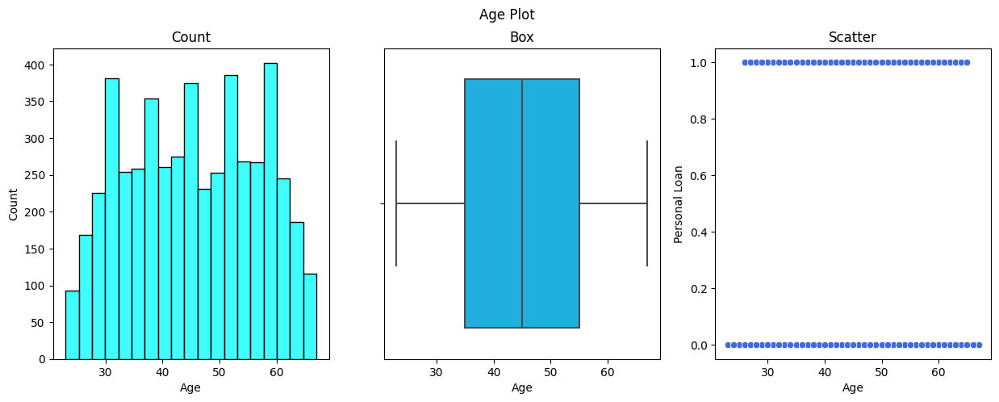

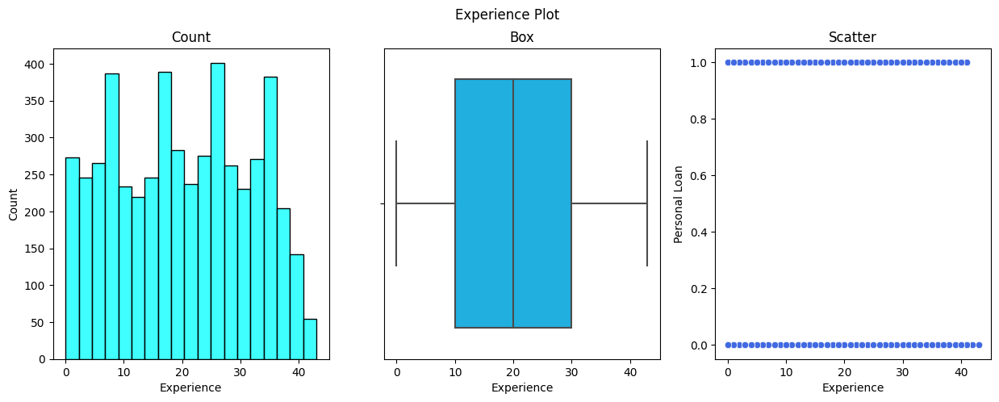

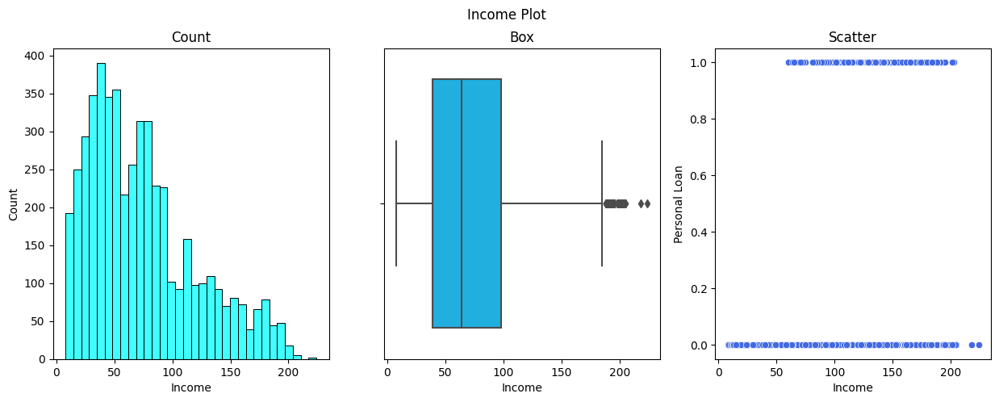

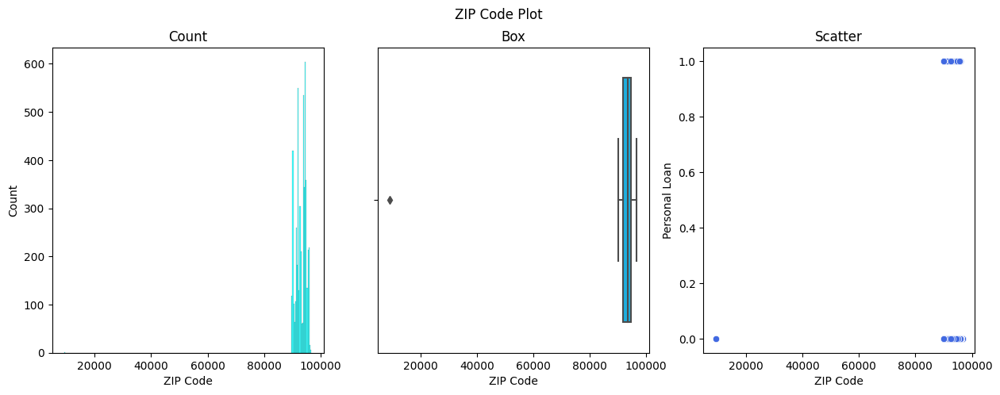

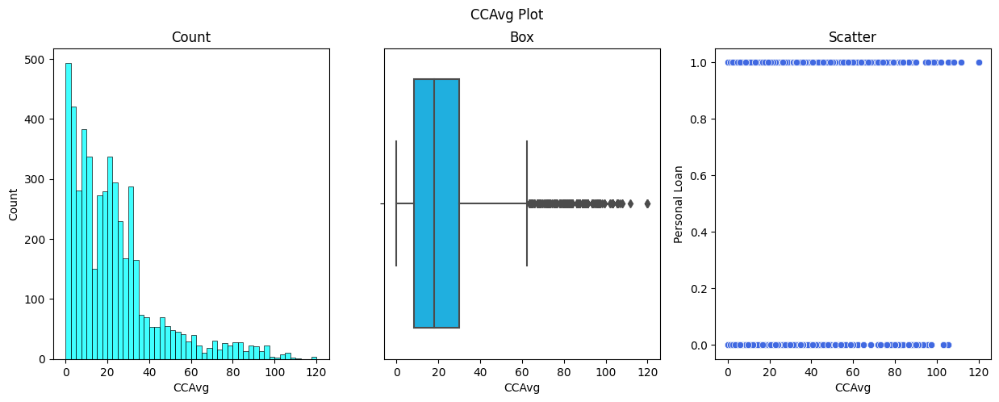

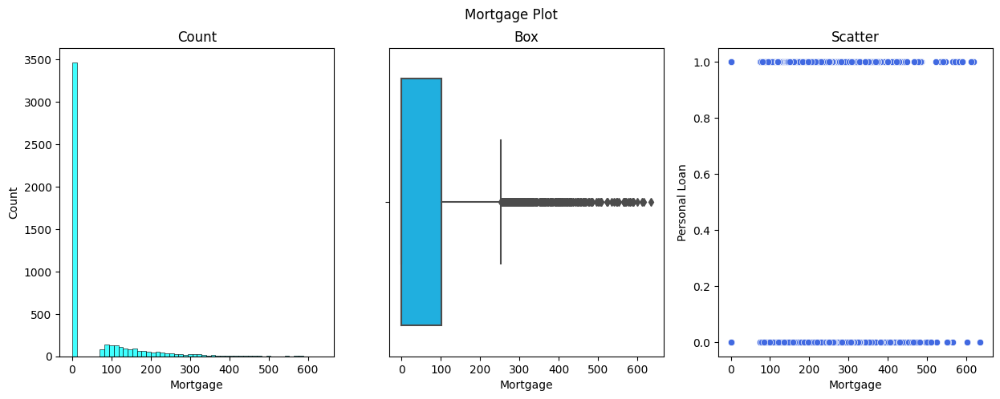

In [18]:
for i in numericaldf:
    figure, plots = plt.subplots(1, 3, figsize=(15, 5),) 
    figure.suptitle(i+' Plot')

    # countplot
    sns.histplot(data=df_final, x=i, color='aqua',ec='black',ax=plots[0])
    plots[0].set_title("Count")
    #plots[0].set_xticks(np.arange(0, 50, 5))

    # boxplot
    sns.boxplot(data=df_final, x=i,ax=plots[1],color='DeepSkyBlue')
    plots[1].set_title("Box")


    sns.scatterplot(data=df_final, x=i,y="Personal Loan", ax=plots[2],color='royalblue')
    plots[2].set_title("Scatter")


    figure.show()

In [19]:
categoricdf=df_final.drop(['ID','Age', 'Experience', 'Income', 'ZIP Code', 'CCAvg', 'Mortgage','postal_code','county_name','county_code','latitude','longitude','place_name'], axis=1)
categoricdf

,Family,Education,Personal Loan,Securities Account,CD Account,Online,CreditCard,decade
0,4,1,0,1,0,0,0,twenty
1,3,1,0,1,0,0,0,forty
2,1,1,0,0,0,0,0,thirty
3,1,2,0,0,0,0,0,thirty
4,4,2,0,0,0,0,1,thirty
...,...,...,...,...,...,...,...,...
4995,1,3,0,0,0,1,0,twenty
4996,4,1,0,0,0,1,0,thirty
4997,2,3,0,0,0,0,0,sixty
4998,3,2,0,0,0,1,0,sixty


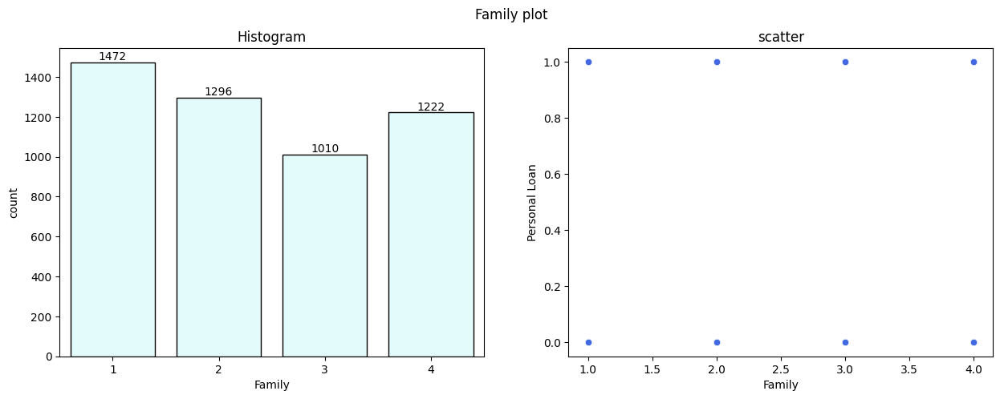

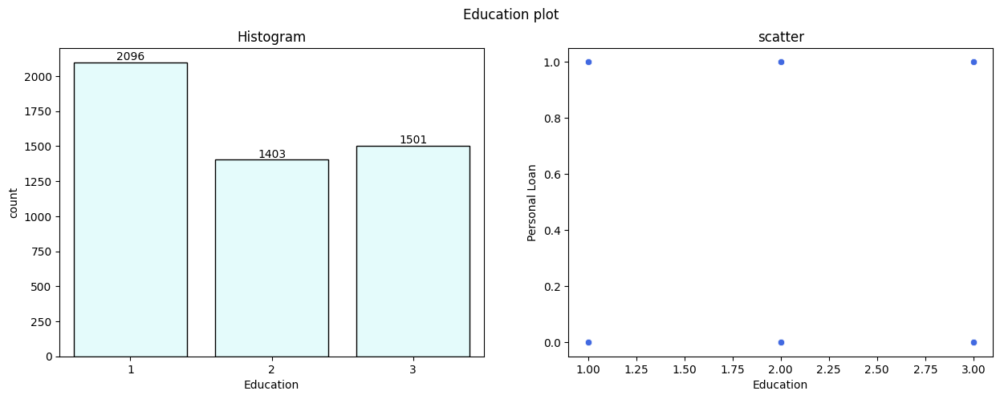

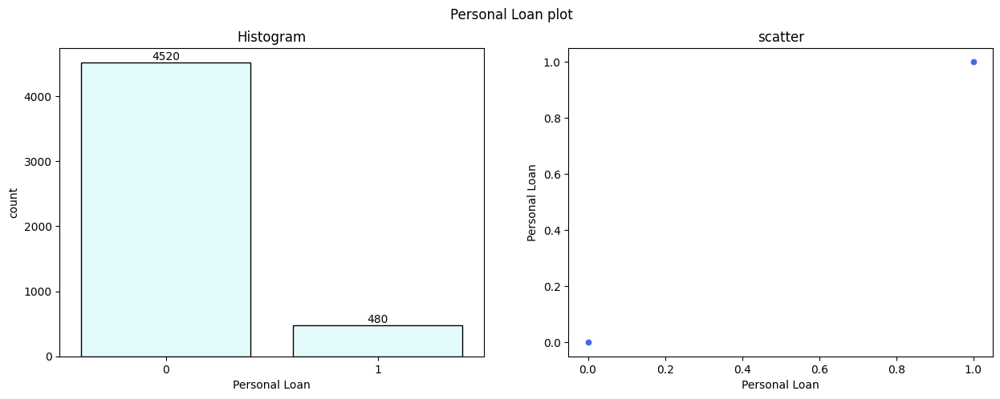

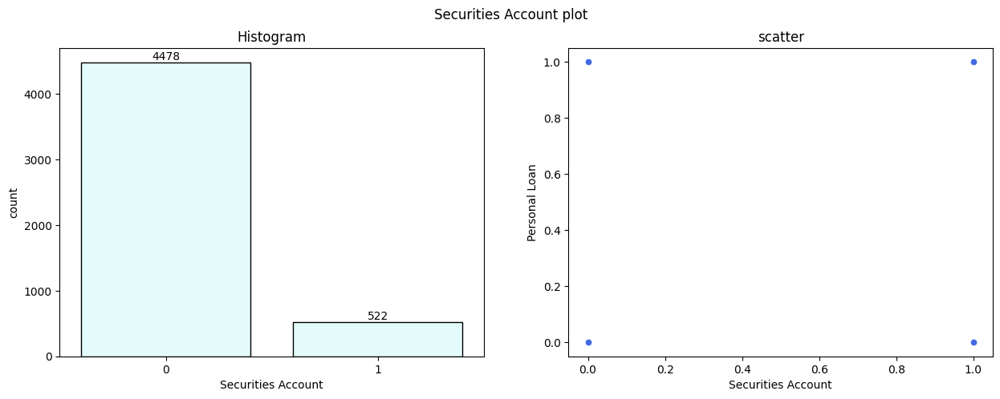

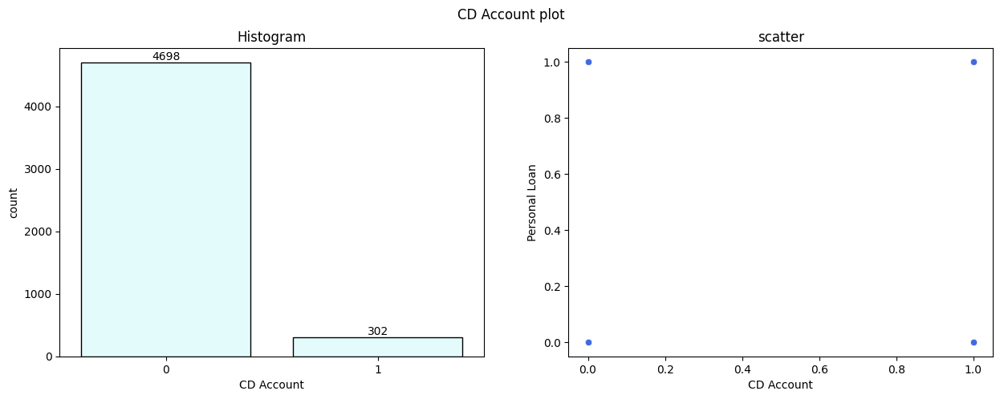

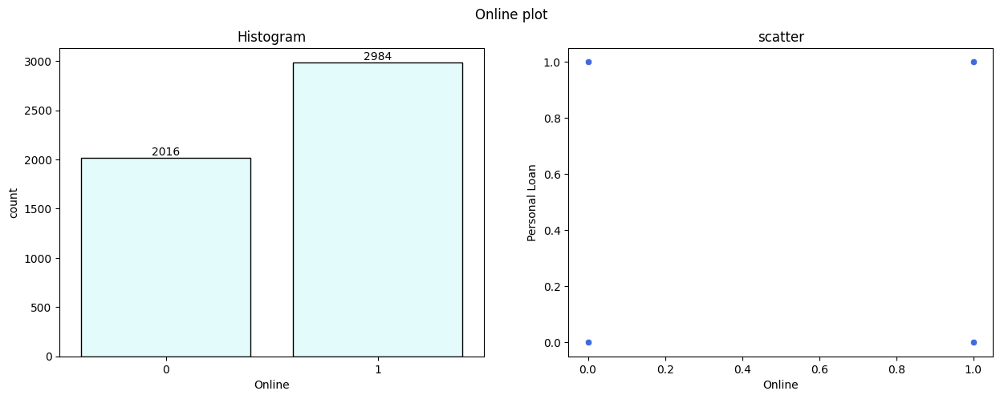

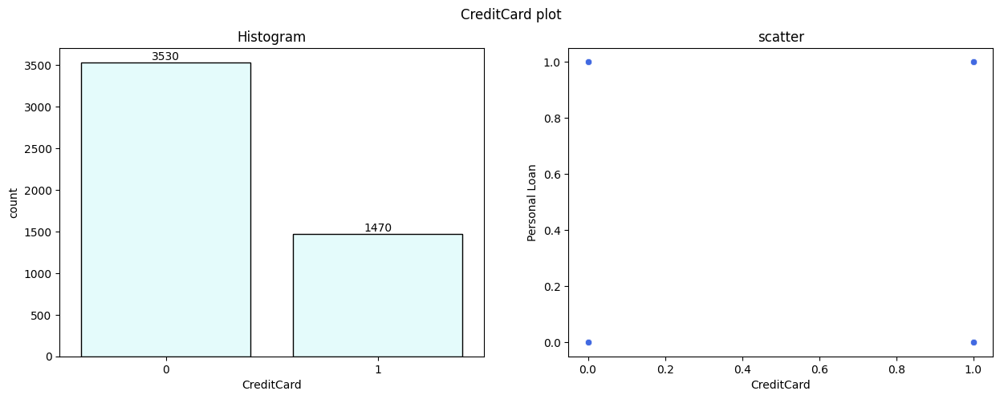

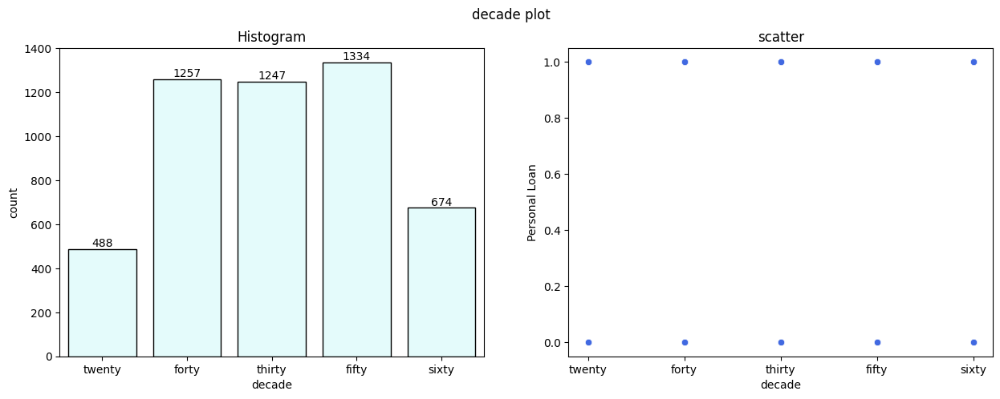

In [20]:
for i in categoricdf:
    figure, plots = plt.subplots(1,2, figsize=(15, 5),) 
    figure.suptitle(i+' plot')

    # histplot
    ax=sns.countplot(data=df_final, x=i, color='lightCyan',ec='black',ax=plots[0])
    plots[0].set_title("Histogram")
    for container in ax.containers:
        ax.bar_label(container)   

    sns.scatterplot(data=df_final, x=i,y="Personal Loan", ax=plots[1],color='royalblue')
    plots[1].set_title("scatter")


    figure.show()


In [21]:
#elimination of noise and missing value

df_final2= df_final[df_final["ZIP Code"]>20000] # according to zipcode plot( one zipcode recognised )
df_final3=df_final2.dropna()  
df_final3

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,...,CD Account,Online,CreditCard,decade,postal_code,place_name,county_name,county_code,latitude,longitude
0,1,25,1,49,91107,4,19.2,1,0,0,...,0,0,0,twenty,91107,Pasadena,Los Angeles,37.0,34.1510,-118.0889
1,2,45,19,34,90089,3,18.0,1,0,0,...,0,0,0,forty,90089,Los Angeles,Los Angeles,37.0,33.7866,-118.2987
2,3,39,15,11,94720,1,12.0,1,0,0,...,0,0,0,thirty,94720,Berkeley,Alameda,1.0,37.8738,-122.2549
3,4,35,9,100,94112,1,32.4,2,0,0,...,0,0,0,thirty,94112,San Francisco,City and County of San Francisco,75.0,37.7195,-122.4411
4,5,35,8,45,91330,4,12.0,2,0,0,...,0,0,1,thirty,91330,Northridge,Los Angeles,37.0,34.2283,-118.5368
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,22.8,3,0,0,...,0,1,0,twenty,92697,Irvine,Orange,59.0,33.6485,-117.8387
4996,4997,30,4,15,92037,4,4.8,1,85,0,...,0,1,0,thirty,92037,La Jolla,San Diego,73.0,32.8455,-117.2521
4997,4998,63,39,24,93023,2,3.6,3,0,0,...,0,0,0,sixty,93023,Ojai,Ventura,111.0,34.4451,-119.2565
4998,4999,65,40,49,90034,3,6.0,2,0,0,...,0,1,0,sixty,90034,Los Angeles,Los Angeles,37.0,34.0290,-118.4005


# Modeling

In [22]:
df_visual=df_final3.drop(["decade","place_name","county_name","postal_code","county_code"], axis=1)

<Axes: >

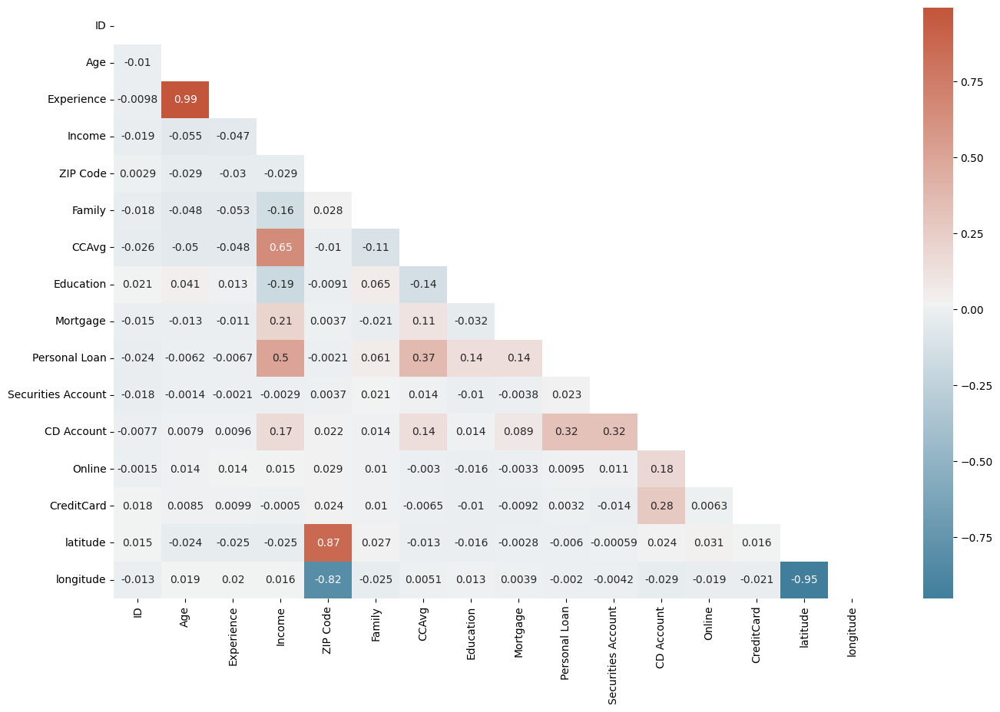

In [23]:
corr = df_visual.corr()

f, ax = plt.subplots(figsize=(16, 10))

mask = np.triu(np.ones_like(corr, dtype=bool))

cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(corr, annot=True, mask = mask, cmap=cmap)

In [24]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

In [25]:
import pprint
from scipy import stats
from IPython.display import display

def plot_grid_search(clf):
    """Plot as many graphs as parameters are in the grid search results.

    Each graph has the values of each parameter in the X axis and the Score in the Y axis.

    Parameters
    ----------
    clf: estimator object result of a GridSearchCV
        This object contains all the information of the cross validated results for all the parameters combinations.
        www.kaggle.com/ahmadrafiee
    """
    # Convert the cross validated results in a DataFrame ordered by `rank_test_score` and `mean_fit_time`.
    # As it is frequent to have more than one combination with the same max score,
    # the one with the least mean fit time SHALL appear first.
    cv_results = pd.DataFrame(clf.cv_results_).sort_values(by=['rank_test_score', 'mean_fit_time'])

    # Get parameters
    parameters=cv_results['params'][0].keys()

    # Calculate the number of rows and columns necessary
    rows = -(-len(parameters) // 2)
    columns = min(len(parameters), 2)
    # Create the subplot
    fig = make_subplots(rows=rows, cols=columns)
    # Initialize row and column indexes
    row = 1
    column = 1

    # For each of the parameters
    for parameter in parameters:

        # As all the graphs have the same traces, and by default all traces are shown in the legend,
        # the description appears multiple times. Then, only show legend of the first graph.
        if row == 1 and column == 1:
            show_legend = True
        else:
            show_legend = False

        # Mean test score
        mean_test_score = cv_results[cv_results['rank_test_score'] != 1]
        fig.add_trace(go.Scatter(
            name='Mean test score',
            x=mean_test_score['param_' + parameter],
            y=mean_test_score['mean_test_score'],
            mode='markers',
            marker=dict(size=mean_test_score['mean_fit_time'],
                        color='SteelBlue',
                        sizeref=2. * cv_results['mean_fit_time'].max() / (40. ** 2),
                        sizemin=4,
                        sizemode='area'),
            text=mean_test_score['params'].apply(
                lambda x: pprint.pformat(x, width=-1).replace('{', '').replace('}', '').replace('\n', '<br />')),
            showlegend=show_legend),
            row=row,
            col=column)

        # Best estimators
        rank_1 = cv_results[cv_results['rank_test_score'] == 1]
        fig.add_trace(go.Scatter(
            name='Best estimators',
            x=rank_1['param_' + parameter],
            y=rank_1['mean_test_score'],
            mode='markers',
            marker=dict(size=rank_1['mean_fit_time'],
                        color='Crimson',
                        sizeref=2. * cv_results['mean_fit_time'].max() / (40. ** 2),
                        sizemin=4,
                        sizemode='area'),
            text=rank_1['params'].apply(str),
            showlegend=show_legend),
            row=row,
            col=column)

        fig.update_xaxes(title_text=parameter, row=row, col=column)
        fig.update_yaxes(title_text='Score', row=row, col=column)

        # Check the linearity of the series
        # Only for numeric series
        if pd.to_numeric(cv_results['param_' + parameter], errors='coerce').notnull().all():
            x_values = cv_results['param_' + parameter].sort_values().unique().tolist()
            r = stats.linregress(x_values, range(0, len(x_values))).rvalue
            # If not so linear, then represent the data as logarithmic
            if r < 0.86:
                fig.update_xaxes(type='log', row=row, col=column)

        # Increment the row and column indexes
        column += 1
        if column > columns:
            column = 1
            row += 1

            # Show first the best estimators
    fig.update_layout(legend=dict(traceorder='reversed'),
                      width=columns * 360 + 150,
                      height=rows * 360,
                      title='Best score: {:.6f} with {}'.format(cv_results['mean_test_score'].iloc[0],
                            str(cv_results['params'].iloc[0]).replace('{', '').replace( '}', '')),
                      title_font=dict(size=20, color='navy', family="Gabriola"),
                      font=dict(color='navy',size=17),font_family="Gabriola",
                      #legend=dict(orientation="h", yanchor="bottom", y=1.15, xanchor="right", x=0.90),
                      #margin=dict(t=80, b=30, l=70, r=40),
                      hovermode='closest',
                      template='none')
    fig.show()

In [26]:
# for filtering warning
import os
os.environ["PYTHONWARNINGS"] = "ignore"

In [27]:
X=pd.DataFrame(df_final3, columns=["Age","Experience", "Income", "Family", "CCAvg" ,"Education", "Mortgage", "Securities Account", "CD Account","Online", "CreditCard","latitude","longitude"])
y=df_final3["Personal Loan"].values.reshape(-1,1)

In [28]:
#kfold
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



logreg=LogisticRegression(solver="liblinear",)
kfold_validation=KFold(10)

results=cross_val_score(logreg , X , y, cv=kfold_validation)
print(results)
print("\n"," Accuracy: ",np.mean(results)*100,"%")

[0.95564516 0.94959677 0.94556452 0.93346774 0.95766129 0.94959677
 0.96169355 0.94758065 0.96370968 0.94949495]

  Accuracy:  95.14011078527209 %


In [29]:
from itertools import product
 
def two_product(list_test, solver):
 
    # return the list of all the computed tuple
    # using the product() method
    return list(product(list_test, solver)) 
   
list_test = [0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
solver = ["liblinear", "newton-cg" ,"lbfgs","sag","saga"]



def three_product(penal, C_val,max_ite):
 
    # return the list of all the computed tuple
    # using the product() method
    return list(product(penal, C_val,max_ite))


penal=['l2',"none"]
C_val=[0.01,0.1,1,10,100]
max_ite=[1000,5000,10000]



df_info = pd.DataFrame (columns=["Test size" , "Solver" ,"Penalty", "C" ,"Max iter", "Accuracy score" , "Precision score", "Recall score", "F1 score" ,"Mean absolute",  "Mean squared", "R2 score"])


for sample in two_product(list_test, solver):
   # print(sample)
    

    for sample2 in three_product(penal, C_val,max_ite):
        
        if sample[1]=="liblinear" :
            X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=sample[0], random_state=0)
            logreg=LogisticRegression(solver=sample[1], penalty='l2', C=sample2[1], max_iter=sample2[2])
            logreg.fit(X_train,y_train)
            y_pred=logreg.predict(X_test)
        else:
            X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=sample[0], random_state=0)
            logreg=LogisticRegression(solver=sample[1], penalty=sample2[0], C=sample2[1], max_iter=sample2[2])
            logreg.fit(X_train,y_train)
            y_pred=logreg.predict(X_test)
            
                
        test_size = sample[0]
        solver = sample[1]
        
        
        penalty=sample2[0]
        C=sample2[1]
        max_iter=sample2[2]
                   
        accuracy_score=metrics.accuracy_score(y_test, y_pred)
        precision_score=metrics.precision_score(y_test, y_pred)
        recall_score=metrics.recall_score(y_test, y_pred) 
        f1_score=metrics.f1_score(y_test, y_pred)
        mean_absolute=metrics.mean_absolute_error(y_test , y_pred)
        mean_squared=metrics.mean_squared_error(y_test , y_pred)
        r2_score= metrics.r2_score(y_test , y_pred)
        

    
        df_info.loc[len(df_info.index)] = [test_size , solver ,penalty, C ,max_iter, accuracy_score , precision_score, recall_score, f1_score, mean_absolute,  mean_squared, r2_score] 
    

 
    
df_info   

,Test size,Solver,Penalty,C,Max iter,Accuracy score,Precision score,Recall score,F1 score,Mean absolute,Mean squared,R2 score
0,0.15,liblinear,l2,0.01,1000,0.930108,0.705882,0.493151,0.580645,0.069892,0.069892,0.210175
1,0.15,liblinear,l2,0.01,5000,0.930108,0.705882,0.493151,0.580645,0.069892,0.069892,0.210175
2,0.15,liblinear,l2,0.01,10000,0.930108,0.705882,0.493151,0.580645,0.069892,0.069892,0.210175
3,0.15,liblinear,l2,0.10,1000,0.942204,0.788462,0.561644,0.656000,0.057796,0.057796,0.346875
4,0.15,liblinear,l2,0.10,5000,0.942204,0.788462,0.561644,0.656000,0.057796,0.057796,0.346875
...,...,...,...,...,...,...,...,...,...,...,...,...
895,0.40,saga,none,10.00,5000,0.949093,0.794118,0.596685,0.681388,0.050907,0.050907,0.385971
896,0.40,saga,none,10.00,10000,0.949093,0.794118,0.596685,0.681388,0.050907,0.050907,0.385971
897,0.40,saga,none,100.00,1000,0.934476,0.686131,0.519337,0.591195,0.065524,0.065524,0.209666
898,0.40,saga,none,100.00,5000,0.949093,0.794118,0.596685,0.681388,0.050907,0.050907,0.385971


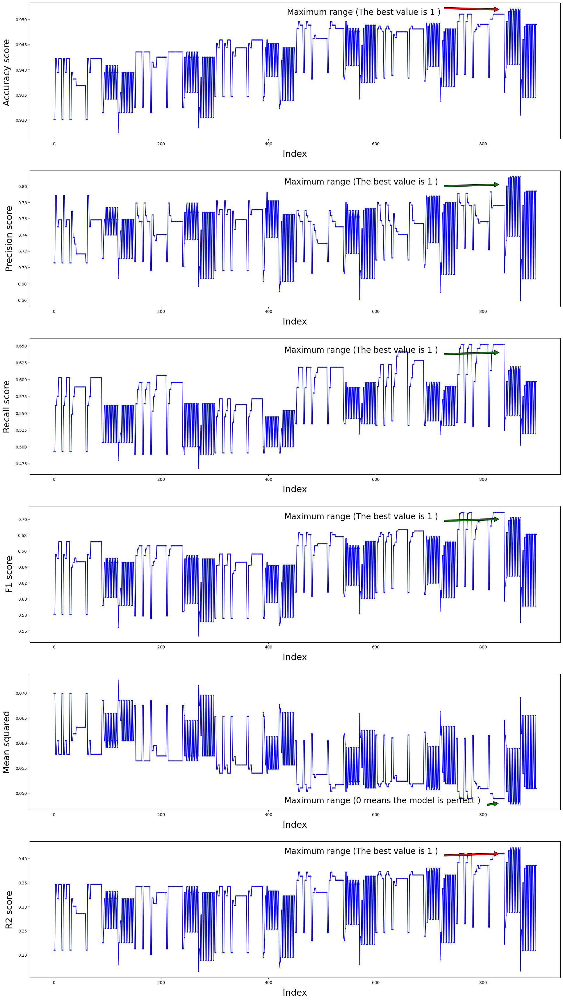

In [30]:
fig, ax = plt.subplots(6,1,facecolor="white",figsize = (20 ,35))

ax[0].plot(df_info.index, df_info["Accuracy score" ]  , alpha = 1,  color='b', marker='.', markersize=3, markerfacecolor='white')
ax[1].plot(df_info.index , df_info["Precision score"],  color='b', marker='.', markersize=3,markerfacecolor='white')
ax[2].plot(df_info.index , df_info["Recall score"]  , alpha = 1,  color='b', marker='.', markersize=3, markerfacecolor='white')
ax[3].plot(df_info.index , df_info[ "F1 score"]  , alpha = 1,  color='b', marker='.', markersize=3, markerfacecolor='white')
ax[4].plot(df_info.index , df_info["Mean squared"]  , alpha = 1,  color='b', marker='.', markersize=3, markerfacecolor='white')
ax[5].plot(df_info.index , df_info[ "R2 score"]  , alpha = 1,  color='b', marker='.', markersize=3, markerfacecolor='white')


ax[0].set_xlabel('Index',fontname="Gulasch",fontsize=22,labelpad=10)
ax[1].set_xlabel('Index',fontname="Gulasch",fontsize=22,labelpad=10)
ax[2].set_xlabel('Index',fontname="Gulasch",fontsize=22,labelpad=10)
ax[3].set_xlabel('Index',fontname="Gulasch",fontsize=22,labelpad=10)
ax[4].set_xlabel('Index',fontname="Gulasch",fontsize=22,labelpad=10)
ax[5].set_xlabel('Index',fontname="Gulasch",fontsize=22,labelpad=10)
 
ax[0].set_ylabel('Accuracy score ',fontname="Gulasch",fontsize=22,labelpad=10)    
ax[1].set_ylabel('Precision score',fontname="Georgia",fontsize=22,labelpad=10)
ax[2].set_ylabel('Recall score',fontname="Georgia",fontsize=22,labelpad=10)
ax[3].set_ylabel('F1 score',fontname="Georgia",fontsize=22,labelpad=10)
ax[4].set_ylabel('Mean squared',fontname="Georgia",fontsize=22,labelpad=10)
ax[5].set_ylabel('R2 score',fontname="Georgia",fontsize=22,labelpad=10)

plt. grid(False)

ax[0].annotate(' Maximum range (The best value is 1 ) ', xy=(830, 0.952), xytext=(430, 0.951),fontsize=20,fontname="Gabriola",
             arrowprops=dict(facecolor='red', shrink=0.00),)

ax[1].annotate('Maximum range (The best value is 1 )  ', xy=(830, 0.802), xytext=(430, 0.802),fontsize=20,fontname="Gabriola",
             arrowprops=dict(facecolor='green', shrink=0.00),)

ax[2].annotate('Maximum range (The best value is 1 )  ', xy=(830,0.64), xytext=(430, 0.64),fontsize=20,fontname="Gabriola",
             arrowprops=dict(facecolor='green', shrink=0.00),)
ax[3].annotate('Maximum range (The best value is 1 )  ', xy=(830,0.70), xytext=(430, 0.7),fontsize=20,fontname="Gabriola",
             arrowprops=dict(facecolor='green', shrink=0.00),)

ax[4].annotate('Maximum range (0 means the model is perfect )  ', xy=(830, 0.048), xytext=(430, 0.048),fontsize=20,fontname="Gabriola",
             arrowprops=dict(facecolor='green', shrink=0.05),)
ax[5].annotate('Maximum range (The best value is 1 )  ', xy=(830, 0.41), xytext=(430, 0.41),fontsize=20,fontname="Gabriola",
             arrowprops=dict(facecolor='red', shrink=0.00),)


fig.tight_layout(pad=3)



plt.show()

In [31]:
df_info.loc[[df_info["Accuracy score"].idxmax()]]

,Test size,Solver,Penalty,C,Max iter,Accuracy score,Precision score,Recall score,F1 score,Mean absolute,Mean squared,R2 score
851,0.4,sag,l2,10.0,10000,0.952117,0.811594,0.618785,0.702194,0.047883,0.047883,0.422448


In [32]:
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

list_test = [0.15, 0.2, 0.25, 0.3, 0.35, 0.4]

for i in list_test:
    x_train, x_test, y_train, y_test=train_test_split(X,y,test_size=i)
    scaler= StandardScaler()
    scaler.fit(x_train)
    
    X_train_scaled = scaler.transform(x_train)
    X_test_scaled = scaler.transform(x_test)

    logreg=LogisticRegression()

    grid={"C":np.logspace(-2,4,10), "penalty":["l1","l2", "none", ],"solver":["liblinear", "newton-cg" ,"lbfgs","sag","saga"],"max_iter":[1000,5000,10000] }# l1 lasso l2 ridge
    
    logreg_Grid=GridSearchCV(logreg,grid,cv=10,verbose=1, n_jobs=-1,scoring='roc_auc',return_train_score=True)
    logreg_Grid.fit(X_train_scaled,y_train)
    print("Test size : ", i)
    #print("tuned hpyerparameters :(best parameters) ",logreg_cv.best_params_)
    #print("accuracy :",logreg_cv.best_score_) 
    plot_grid_search(logreg_Grid)

Fitting 10 folds for each of 450 candidates, totalling 4500 fits
Test size :  0.15


Fitting 10 folds for each of 450 candidates, totalling 4500 fits
Test size :  0.2


Fitting 10 folds for each of 450 candidates, totalling 4500 fits
Test size :  0.25


Fitting 10 folds for each of 450 candidates, totalling 4500 fits
Test size :  0.3


Fitting 10 folds for each of 450 candidates, totalling 4500 fits
Test size :  0.35


Fitting 10 folds for each of 450 candidates, totalling 4500 fits
Test size :  0.4


In [33]:
from sklearn.metrics import  auc

X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.35, random_state=0)

scaler= StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

logreg=LogisticRegression(solver="liblinear", penalty="l2", C=0.046415888336127774, max_iter=10000)
logreg.fit(X_train_scaled,y_train)
y_pred=logreg.predict(X_test_scaled)

y_pred_proba_log = logreg.predict_proba(X_test_scaled)
fpr_log, tpr_log, _ = metrics.roc_curve(y_test, y_pred_proba_log[:,1])
auc_log = round(metrics.auc(fpr_log, tpr_log),5)

In [34]:
fig = make_subplots(rows=1,cols=3, specs=[[{"type": "scatter"} for _ in range(3)] for _ in range(1)],
                    subplot_titles=("ROC curve", "Multiclass ROC Curve","Precision-Recall Curves"),horizontal_spacing=0.09)




#y_pred_proba = logreg.predict_proba(X_test)[:, 1]
#fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_proba)



#ROC curve


#auc = round(metrics.roc_auc_score(y_test, y_pred_proba_log),5)
fig.add_trace(go.Scatter(x=fpr_log, y=tpr_log,mode='lines',name="ROC Curve (AUC="+str(auc_log*100) + "%)",marker_color='skyblue'
                         ,fill="tonexty"),row=1, col=1)
fig.add_trace(go.Scatter(x=[0,1], y=[0,1],mode='lines',name='threshold',marker_color='darkorange'),row=1, col=1)








#Multiclass ROC Curve

logreg_X=LogisticRegression(solver="liblinear", penalty="l2", C=0.046415888336127774, max_iter=1000)
logreg_X.fit(X,y)

y_plot=df_final3["Personal Loan"]
y_scores = logreg_X.predict_proba(X)


y_onehot = pd.get_dummies(y_plot, columns=logreg_X.classes_)

# Create an empty figure, and iteratively add new lines
# every time we compute a new class



for i in range(y_scores.shape[1]):
    y_true = y_onehot.iloc[:, i]
    y_score = y_scores[:, i]

    fpr, tpr, _ = metrics.roc_curve(y_true, y_score)
    auc_score = metrics.roc_auc_score(y_true, y_score)

    name = f"{y_onehot.columns[i]} (AUC={auc_score:.2f})"
    fig.add_trace(go.Scatter(x=fpr, y=tpr, name=name, mode='lines'),row=1, col=2)

fig.add_trace(go.Scatter(x=[0,1], y=[0,1],mode='lines',name='lines',marker_color='darkorange',showlegend=False),row=1, col=2)







#Precision-Recall Curves
y_pred_proba = logreg.predict_proba(X_test_scaled)[:, 1]
precision, recall, thresholds = metrics. precision_recall_curve(y_test, y_pred_proba)

fig.add_trace(go.Scatter(x=recall, y=precision, mode='lines',name='Precision-Recall Curves',marker_color='DodgerBlue',fill="tonexty")
              ,row=1, col=3)
fig.add_trace(go.Scatter(x=[1,0], y=[0,1],mode='lines',name='lines',marker_color='darkorange',showlegend=False),row=1, col=3)








#layout

fig.update_layout(title = 'Curve visualizatoin ',title_font=dict(size=35, color='navy', family="Gabriola"),
                  #xaxis= dict(constrain='domain',zeroline= False,showgrid=False,griddash='dot', gridcolor='black',linewidth=0.2),
                  #yaxis= dict(scaleanchor="x",tick0 = 0.0, scaleratio=1,zeroline= False,showgrid=False,griddash='dot',gridcolor='gray', showticklabels=True),
                  width=980, height=650, plot_bgcolor='white',font=dict(color='navy',size=17),
                  font_family="Gabriola",
                  legend=dict(orientation="h", yanchor="bottom", y=1.15, xanchor="right", x=0.90),
                  margin=dict(t=230, b=100, l=70, r=40))



fig['layout']['xaxis']['title']='False Positive Rate'
fig['layout']['xaxis2']['title']='False Positive Rate'
fig['layout']['xaxis3']['title']='Recall'

fig['layout']['yaxis']['title']='True Positive Rate'
fig['layout']['yaxis2']['title']='True Positive Rate'
fig['layout']['yaxis3']['title']='Precision'




fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

In [35]:
from sklearn.metrics import classification_report , confusion_matrix
logreg.classes_


array([0, 1])

In [36]:
logreg_conf=metrics.confusion_matrix(y_test, y_pred)

In [37]:
fig = make_subplots(rows=1,cols=2, specs=[[{"type": "Heatmap"},{"type": "sankey"}] ],
                    subplot_titles=("Confusion Matrix", "Sankey"),horizontal_spacing=0.09)


#confusionmatrix

confusion_matrix = metrics.confusion_matrix(y_test, y_pred)
confusion_matrix = confusion_matrix.astype(int)


    
color_scale = [[0, 'lightcyan'], #0 
              [.1, 'blue'], #.1
              [.2, 'LightSkyBlue'], #.2
              [.3, 'DeepSkyBlue'], #.3
              [.4, 'DodgerBlue'], #.4
              [.5, 'CornflowerBlue'], #.5 
              [.6, 'MediumSlateBlue'], #.6
              [.7, 'RoyalBlue'], #.7
              [.8, 'MediumBlue'], #.8
              [.9, 'DarkBlue'], #.9
              [1., 'navy'], #1
              ]
    
    
fig.add_trace(go.Heatmap(z=confusion_matrix,
                                    x=logreg.classes_,
                                    y=logreg.classes_,
                                    hoverongaps=False,
                                    text=[[(logreg_conf[0][0] ," True Positive"), (logreg_conf[0][1]," False Positive")],
                                          [(logreg_conf[1][0]," False Negative"), (logreg_conf[1][1] ," True Negative")]],
                                    texttemplate="%{text}",
                                    textfont={"size":10},
                                    colorscale = color_scale,showscale=False,
                                    colorbar = dict(tickvals=[0, .2, .4, .6, .8, 1])),row=1,col=1)
    
    
    
    
    
#sankey


link_color = ["lightgreen","lightgreen","rgb(255,114,118)","rgb(255,114,118)"]

node_color = ["Gold","purple","aqua","DeepPink"]

fig.add_trace(go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "gray", width = 0.5),
      label = ["Actuall Class= 0", "Actuall Class= 1", "Predicted class=0", "Predicted class=1"],
      color = node_color,
      hovertemplate= 'Node %{label} has total value %{value}<extra></extra>',
    ),
    link = dict(
      source = [0, 1, 0, 1], 
      target = [2, 3, 3, 2],
      value = [1777, 112, 26, 69],
      color = link_color  ,
      customdata =[[98.55,96.26],
                   [61.87,81.15],
                   [1.44,18.85],
                   [38.13,3.77]],
      hovertemplate='Link has value %{value},<br />'+
        "accounting for %{customdata[0]}% of original node" +
        '<br />and %{customdata[1]}% of target node<extra></extra>',
      
       
  )),row=1,col=2)





#layout

fig.update_layout(title = 'Curve visualizatoin ',title_font=dict(size=35, color='navy', family="Gabriola"),
                  #xaxis= dict(constrain='domain',zeroline= False,showgrid=False,griddash='dot', gridcolor='black',linewidth=0.2),
                  #yaxis= dict(scaleanchor="x",tick0 = 0.0, scaleratio=1,zeroline= False,showgrid=False,griddash='dot',gridcolor='gray', showticklabels=True),
                  width=980, height=650, plot_bgcolor='white',font=dict(color='navy',size=15),
                  font_family="cursive",
                  legend=dict(orientation="h", yanchor="bottom", y=1.15, xanchor="right", x=0.90),
                  margin=dict(t=230, b=100, l=70, r=40))



fig['layout']['xaxis']['title']='Predicted Value'



fig['layout']['yaxis']['title']='Actual Value'






fig.show()

In [38]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import ComplementNB
from sklearn.naive_bayes import BernoulliNB

from sklearn import metrics

In [39]:
X=pd.DataFrame(df_final3, columns=["Age","Experience", "Income", "Family" ,"Education", "Securities Account", "CD Account","Online", "CreditCard"])
y=df_final3["Personal Loan"].values.reshape(-1,1)

In [40]:
from sklearn.model_selection import GridSearchCV

param_grid_nb = {'alpha': [0.00001, 0.0001, 0.001, 0.1, 1, 10, 100,1000,5000]}
list_test = [0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
for i in list_test:
    X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=i, random_state=0)
    nbmModel_grid = GridSearchCV(estimator=MultinomialNB(), param_grid=param_grid_nb, verbose=1, cv=10, n_jobs=-1,scoring='roc_auc',return_train_score=True)
    nbmModel_grid.fit(X_train, y_train)
    print("Test Size: " ,i)
    #print(nbMmodel_grid.best_estimator_)
    #print("Best  parameters:", nbMmodel_grid.best_params_)
    #print("Best score:", nbMmodel_grid.best_score_)
    plot_grid_search(nbmModel_grid)

Fitting 10 folds for each of 9 candidates, totalling 90 fits
Test Size:  0.15


Fitting 10 folds for each of 9 candidates, totalling 90 fits
Test Size:  0.2


Fitting 10 folds for each of 9 candidates, totalling 90 fits
Test Size:  0.25


Fitting 10 folds for each of 9 candidates, totalling 90 fits
Test Size:  0.3


Fitting 10 folds for each of 9 candidates, totalling 90 fits
Test Size:  0.35


Fitting 10 folds for each of 9 candidates, totalling 90 fits
Test Size:  0.4


In [41]:
from sklearn.preprocessing import StandardScaler

def two_product(list_test, alpha):
 
    # return the list of all the computed tuple
    # using the product() method
    return list(product(list_test, alpha)) 
   
list_test = [0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
alpha = [0.00001, 0.0001, 0.001, 0.1, 1, 10,1000]

df_naive_M = pd.DataFrame (columns=["Test size" ,"alpha", "Accuracy score" , "Precision score", "Recall score", "F1 score" ])


for sample in two_product(list_test, alpha):
    
    X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=sample[0], random_state=0)
    
    clf=MultinomialNB(alpha=sample[1])
    clf.fit(X_train , y_train.ravel())
    y_pred=clf.predict(X_test)

    alpha=sample[1]
    test_size = sample[0]
    accuracy_score=metrics.accuracy_score(y_test, y_pred)
    precision_score=metrics.precision_score(y_test, y_pred)
    recall_score=metrics.recall_score(y_test, y_pred) 
    f1_score=metrics.f1_score(y_test, y_pred)
   
    
    df_naive_M.loc[len(df_naive_M.index)] = [test_size ,alpha, accuracy_score , precision_score, recall_score, f1_score]
    
df_naive_M        
df_naive_M.style.highlight_max(color = 'aqua', axis = 0)    
  

,Test size,alpha,Accuracy score,Precision score,Recall score,F1 score
0,0.150000,0.000010,0.786290,0.289216,0.808219,0.425993
1,0.150000,0.000100,0.786290,0.289216,0.808219,0.425993
2,0.150000,0.001000,0.786290,0.289216,0.808219,0.425993
3,0.150000,0.100000,0.786290,0.289216,0.808219,0.425993
4,0.150000,1.000000,0.786290,0.289216,0.808219,0.425993
5,0.150000,10.000000,0.784946,0.287805,0.808219,0.424460
6,0.150000,1000.000000,0.817204,0.313609,0.726027,0.438017
7,0.200000,0.000010,0.788306,0.285185,0.819149,0.423077
8,0.200000,0.000100,0.788306,0.285185,0.819149,0.423077
9,0.200000,0.001000,0.788306,0.285185,0.819149,0.423077


In [42]:
df_naive_M.sort_values("Accuracy score", ascending=False).head(5)

,Test size,alpha,Accuracy score,Precision score,Recall score,F1 score
41,0.40,1000.0,0.842238,0.312500,0.607735,0.412758
34,0.35,1000.0,0.838710,0.303797,0.615385,0.406780
27,0.30,1000.0,0.838710,0.307420,0.664122,0.420290
20,0.25,1000.0,0.831452,0.303644,0.669643,0.417827
13,0.20,1000.0,0.827621,0.314010,0.691489,0.431894


In [43]:
#Base on GridSearchCV
X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.15, random_state=0)
    
clf_M=MultinomialNB(alpha=0.001)
clf_M.fit(X_train , y_train.ravel())
y_pred=clf_M.predict(X_test)

y_pred_proba_M = clf_M.predict_proba(X_test)
fpr_M, tpr_M, _ = metrics.roc_curve(y_test, y_pred_proba_M[:,1])
auc_M = round(metrics.auc(fpr_M, tpr_M),5)

In [44]:
mnb=metrics.confusion_matrix(y_test, y_pred)
mnb

array([[526, 145],
       [ 14,  59]])

In [45]:
X=pd.DataFrame(df_final3, columns=["Age","Experience", "Income", "Family", "Education",  "Securities Account", "CD Account","Online", "CreditCard"])
y=df_final3["Personal Loan"].values.reshape(-1,1)

In [46]:
from sklearn.model_selection import GridSearchCV

param_grid_nb = {'alpha': [0.00001, 0.0001, 0.001, 0.1, 1, 10, 100,1000,5000],"norm":[False,True]}
list_test = [0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
for i in list_test:
    X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=i, random_state=0)
    nbcModel_grid = GridSearchCV(estimator=ComplementNB(), param_grid=param_grid_nb, verbose=1, cv=10, n_jobs=-1,scoring='roc_auc',return_train_score=True)
    nbcModel_grid.fit(X_train, y_train)
    print("Test Size=" ,i)
    #print(nbcModel_grid.best_estimator_)
    #print("Best parameters:", nbcModel_grid.best_params_)
    #print("Best score:", nbcModel_grid.best_score_)
    plot_grid_search(nbcModel_grid)

Fitting 10 folds for each of 18 candidates, totalling 180 fits
Test Size= 0.15


Fitting 10 folds for each of 18 candidates, totalling 180 fits
Test Size= 0.2


Fitting 10 folds for each of 18 candidates, totalling 180 fits
Test Size= 0.25


Fitting 10 folds for each of 18 candidates, totalling 180 fits
Test Size= 0.3


Fitting 10 folds for each of 18 candidates, totalling 180 fits
Test Size= 0.35


Fitting 10 folds for each of 18 candidates, totalling 180 fits
Test Size= 0.4


In [47]:
def three_product(list_test, alpha,norm):
 
    # return the list of all the computed tuple
    # using the product() method
    return list(product(list_test, alpha,norm))
   
list_test = [0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
alpha = [0.00001, 0.0001, 0.001, 0.1, 1, 10, 100,1000]
norm=[False, True]

df_naive_c = pd.DataFrame (columns=["Test size" ,"Alpha","Norm", "Accuracy score" , "Precision score", "Recall score", "F1 score" ])


for sample in three_product(list_test, alpha,norm):
    
    X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=sample[0], random_state=0)
    clf=ComplementNB(alpha=sample[1],norm=sample[2])
    clf.fit(X_train , y_train.ravel())
    y_pred=clf.predict(X_test)

    norm=sample[2]
    alpha=sample[1]
    test_size = sample[0]
    accuracy_score=metrics.accuracy_score(y_test, y_pred)
    precision_score=metrics.precision_score(y_test, y_pred)
    recall_score=metrics.recall_score(y_test, y_pred) 
    f1_score=metrics.f1_score(y_test, y_pred)
   
    
    df_naive_c.loc[len(df_naive_c.index)] = [test_size ,alpha,norm, accuracy_score , precision_score, recall_score, f1_score]
    
df_naive_c        
df_naive_c.style.highlight_max(color = 'aqua', axis = 0) 

,Test size,Alpha,Norm,Accuracy score,Precision score,Recall score,F1 score
0,0.150000,0.000010,False,0.768817,0.280000,0.863014,0.422819
1,0.150000,0.000010,True,0.737903,0.267176,0.958904,0.417910
2,0.150000,0.000100,False,0.768817,0.280000,0.863014,0.422819
3,0.150000,0.000100,True,0.737903,0.267176,0.958904,0.417910
4,0.150000,0.001000,False,0.768817,0.280000,0.863014,0.422819
5,0.150000,0.001000,True,0.737903,0.267176,0.958904,0.417910
6,0.150000,0.100000,False,0.768817,0.280000,0.863014,0.422819
7,0.150000,0.100000,True,0.737903,0.267176,0.958904,0.417910
8,0.150000,1.000000,False,0.768817,0.280000,0.863014,0.422819
9,0.150000,1.000000,True,0.736559,0.262548,0.931507,0.409639


In [48]:
df_naive_c.sort_values("Accuracy score", ascending=False).head(5)

,Test size,Alpha,Norm,Accuracy score,Precision score,Recall score,F1 score
79,0.35,1000.0,True,0.907258,0.352941,0.038462,0.069364
63,0.30,1000.0,True,0.907258,0.360000,0.068702,0.115385
95,0.40,1000.0,True,0.906250,0.222222,0.011050,0.021053
47,0.25,1000.0,True,0.905645,0.391304,0.080357,0.133333
31,0.20,1000.0,True,0.900202,0.391304,0.095745,0.153846


In [49]:
# base on GridSearchCV
X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.15, random_state=0)
clf_C=ComplementNB(alpha=0.0001,norm=True)
clf_C.fit(X_train , y_train.ravel())
y_pred=clf_C.predict(X_test)

y_pred_proba_C = clf_C.predict_proba(X_test)
fpr_C, tpr_C, _ = metrics.roc_curve(y_test, y_pred_proba_C[:,1])
auc_C = round(metrics.auc(fpr_C, tpr_C),5)

In [50]:
X=pd.DataFrame(df_final3, columns=["Age", "Income", "Family", "CCAvg" ,"Education", "Mortgage", "Securities Account", "CD Account","Online", "CreditCard"])
y=df_final3["Personal Loan"].values.reshape(-1,1)

In [51]:
from sklearn.model_selection import GridSearchCV

param_grid_nb = {'alpha': [0.00001, 0.0001, 0.001, 0.1, 1, 10, 100,1000,5000] }
list_test = [0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
for i in list_test:
    
    X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=i, random_state=0)
    nbbModel_grid = GridSearchCV(estimator=BernoulliNB(), param_grid=param_grid_nb, verbose=1, cv=10, n_jobs=-1,scoring='roc_auc',return_train_score=True)
    scaler= StandardScaler()
    scaler.fit(X_train)

    # Transform training and testing data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    nbbModel_grid.fit(X_train_scaled, y_train)
    
    
    
    
    print("Test Size=" ,i)
    #print(nbbModel_grid.best_estimator_)
    #print("Best parameters:", nbbModel_grid.best_params_)
    #print("Best score:", nbbModel_grid.best_score_)
    plot_grid_search(nbbModel_grid)

Fitting 10 folds for each of 9 candidates, totalling 90 fits
Test Size= 0.15


Fitting 10 folds for each of 9 candidates, totalling 90 fits
Test Size= 0.2


Fitting 10 folds for each of 9 candidates, totalling 90 fits
Test Size= 0.25


Fitting 10 folds for each of 9 candidates, totalling 90 fits
Test Size= 0.3


Fitting 10 folds for each of 9 candidates, totalling 90 fits
Test Size= 0.35


Fitting 10 folds for each of 9 candidates, totalling 90 fits
Test Size= 0.4


In [52]:
def two_product(list_test, alpha):
 
    # return the list of all the computed tuple
    # using the product() method
    return list(product(list_test, alpha))
   
list_test = [0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
alpha = [0.0001, 0.001, 0.1, 1, 10, 100,1000]



df_naive_B = pd.DataFrame (columns=["Test size" ,"Alpha", "Accuracy score" , "Precision score", "Recall score", "F1 score" ])


for sample in two_product(list_test, alpha):
    
    X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=sample[0], random_state=0)
    scaler= StandardScaler()
    scaler.fit(X_train)

    # Transform training and testing data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    clf=BernoulliNB(alpha=sample[1] )
    clf.fit(X_train_scaled , y_train.ravel())
    y_pred=clf.predict(X_test_scaled)

    
    test_size = sample[0]
    alpha=sample[1]
    
    accuracy_score=metrics.accuracy_score(y_test, y_pred)
    precision_score=metrics.precision_score(y_test, y_pred)
    recall_score=metrics.recall_score(y_test, y_pred) 
    f1_score=metrics.f1_score(y_test, y_pred)
    
    
    df_naive_B.loc[len(df_naive_B.index)] = [test_size ,alpha, accuracy_score , precision_score, recall_score, f1_score]
     
df_naive_B        
df_naive_B.style.highlight_max(color = 'aqua', axis = 0)    
    

,Test size,Alpha,Accuracy score,Precision score,Recall score,F1 score
0,0.150000,0.000100,0.913978,0.628571,0.301370,0.407407
1,0.150000,0.001000,0.913978,0.628571,0.301370,0.407407
2,0.150000,0.100000,0.915323,0.656250,0.287671,0.400000
3,0.150000,1.000000,0.913978,0.636364,0.287671,0.396226
4,0.150000,10.000000,0.912634,0.625000,0.273973,0.380952
5,0.150000,100.000000,0.912634,0.625000,0.273973,0.380952
6,0.150000,1000.000000,0.900538,0.333333,0.013699,0.026316
7,0.200000,0.000100,0.912298,0.585366,0.255319,0.355556
8,0.200000,0.001000,0.912298,0.585366,0.255319,0.355556
9,0.200000,0.100000,0.913306,0.605263,0.244681,0.348485


In [53]:
df_naive_B.sort_values("Accuracy score", ascending=False).head(5)

,Test size,Alpha,Accuracy score,Precision score,Recall score,F1 score
26,0.3,100.0000,0.920699,0.614035,0.267176,0.372340
21,0.3,0.0001,0.920027,0.593750,0.290076,0.389744
23,0.3,0.1000,0.920027,0.593750,0.290076,0.389744
22,0.3,0.0010,0.920027,0.593750,0.290076,0.389744
25,0.3,10.0000,0.920027,0.603448,0.267176,0.370370


In [54]:
from sklearn.metrics import  auc
X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.25, random_state=0)
scaler= StandardScaler()
scaler.fit(X_train)

# Transform training and testing data
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
    
clf_B=BernoulliNB(alpha=0.001 )
clf_B.fit(X_train_scaled , y_train.ravel())
y_pred=clf_B.predict(X_test_scaled)

y_pred_proba_B = clf_B.predict_proba(X_test_scaled)
fpr_B, tpr_B, _ = metrics.roc_curve(y_test, y_pred_proba_B[:,1])
auc_B = round(metrics.auc(fpr_B, tpr_B),5)

In [55]:
Naive_conf=metrics.confusion_matrix(y_test, y_pred)
Naive_conf

array([[1104,   24],
       [  81,   31]])

In [56]:
fig = go.Figure()
# the green line represents where TPR = FPR

fig.add_shape(type='line', line=dict(color='darkorange', dash='dash'),x0=0, x1=1, y0=0, y1=1)

fig.add_trace(go.Scatter(x=fpr_B,  y=tpr_B,name="ROC Curve BernoulliNB (AUC="+str(auc_B*100) + "%)", mode='lines'))
fig.add_trace(go.Scatter(x=fpr_C, y=tpr_C,name="ROC Curve ComplementNB (AUC="+str(auc_C*100) + "%)", mode='lines'))
fig.add_trace(go.Scatter(x=fpr_M, y=tpr_M,name="ROC Curve MultinomialNB (AUC="+str(auc_M*100) + "%)", mode='lines'))


#layout
    
fig.update_layout(title= 'Naive Bayes: ROC curve and AUC score',title_font=dict(size=35, color='navy', family="Gabriola"),
                  xaxis_title='False Positive Rate',yaxis_title='True Positive Rate',
                  yaxis=dict(scaleanchor="x", scaleratio=1), xaxis=dict(constrain='domain'),
                  width=980, height=650, plot_bgcolor='white',font=dict(color='navy',size=17),
                  font_family="Gabriola",showlegend=True)



fig.show()
   

In [57]:
from sklearn.neighbors import KNeighborsClassifier

In [58]:
X=pd.DataFrame(df_final3, columns=["Age","Experience", "Income", "Family", "CCAvg" ,"Education", "Mortgage", "Securities Account", "CD Account","Online", "CreditCard","latitude","longitude"])
y=df_final3["Personal Loan"].values.reshape(-1,1)

In [59]:
X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.3, random_state=0)

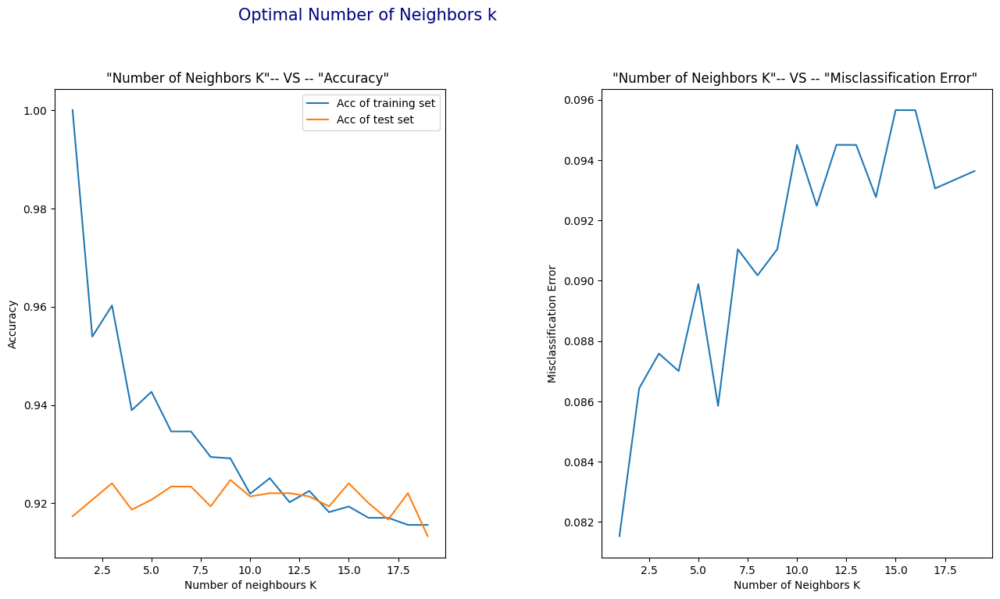

In [60]:
fig, axes =plt.subplots(nrows=1 , ncols=2 , figsize=(20,8))
plt.subplots_adjust(left=0.3, bottom=0.1, right=0.9, top=0.7, wspace=0.4, hspace=0.3)


#neighbors vs accuracy
training_acc=[]
test_acc=[]

neighbors_setting= range(1,20)
for n_neighbors in neighbors_setting:
    knn=KNeighborsClassifier(n_neighbors=n_neighbors)
    knn.fit(X_train,y_train )
    training_acc.append(knn.score(X_train,y_train))
    test_acc.append(knn.score(X_test,y_test))
    
axes[0].set_xlabel("Number of neighbours K")
axes[0].set_ylabel("Accuracy")
axes[0].plot(neighbors_setting ,training_acc , label="Acc of training set" )
axes[0].plot(neighbors_setting ,test_acc , label="Acc of test set" )
   
axes[0].legend(loc='best') 



#Misclassification Error vs Number of Neighbors K
cv_scores=[]
for k in neighbors_setting:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X_train, y_train, cv=10, scoring='accuracy')
    cv_scores.append(scores.mean())

# changing to misclassification error
mse = [1 - x for x in cv_scores]


# plot misclassification error vs k
axes[1].plot(neighbors_setting, mse )
axes[1].set_xlabel("Number of Neighbors K")
axes[1].set_ylabel("Misclassification Error")


axes[0].set_title('"Number of Neighbors K"-- VS -- "Accuracy" ')
axes[1].set_title('"Number of Neighbors K"-- VS -- "Misclassification Error" ')

fig.subplots_adjust(hspace=0.5, top=0.85)
plt.suptitle("Optimal Number of Neighbors k", fontsize=15 , color="navy")

plt.show() 

In [61]:
from sklearn.model_selection import GridSearchCV

param_grid_knn = {'n_neighbors': [6,7,8,9,10],'weights':["uniform", "distance"] ,
                   "p":[1,2,3,4,5,6] ,"metric":["minkowski"]}

#"leaf_size":[10,20,30,40,50],

list_test = [0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
for i in list_test:
    
    X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=i, random_state=0)
    KnnModel_grid = GridSearchCV(estimator=KNeighborsClassifier(), param_grid=param_grid_knn, verbose=1, cv=10, n_jobs=-1,scoring='roc_auc',return_train_score=True)
    scaler= StandardScaler()
    scaler.fit(X_train)

    # Transform training and testing data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    KnnModel_grid.fit(X_train_scaled, y_train)
    
    
    
    
    print("Test Size=" ,i)
    #print(KnnModel_grid.best_estimator_)
    #print("Best parameters:", KnnModel_grid.best_params_)
    #print("Best score:", KnnModel_grid.best_score_)
    plot_grid_search(KnnModel_grid)

Fitting 10 folds for each of 60 candidates, totalling 600 fits
Test Size= 0.15


Fitting 10 folds for each of 60 candidates, totalling 600 fits
Test Size= 0.2


Fitting 10 folds for each of 60 candidates, totalling 600 fits
Test Size= 0.25


Fitting 10 folds for each of 60 candidates, totalling 600 fits
Test Size= 0.3


Fitting 10 folds for each of 60 candidates, totalling 600 fits
Test Size= 0.35


Fitting 10 folds for each of 60 candidates, totalling 600 fits
Test Size= 0.4


In [62]:
def Multi_product(list_test,n_neighbors, weights,leaf_size,p,metric):
 
    # return the list of all the computed tuple
    # using the product() method
    return list(product(list_test,n_neighbors, weights,leaf_size,p,metric))

list_test = [0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
n_neighbors= [6,7,8,9,10]
weights=["uniform", "distance"] 
leaf_size=[10,20,30,40,50]
p=[1,2,3,4,5] 
metric=["minkowski"]


df_KNN = pd.DataFrame (columns=["Test size","n_neighbors", "weights","leaf_size","p","metric", "Accuracy score" , "Precision score", "Recall score", "F1 score" ])


for sample in Multi_product(list_test,n_neighbors, weights,leaf_size,p,metric):
    
    X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=sample[0], random_state=0)
    scaler= StandardScaler()
    scaler.fit(X_train)

    # Transform training and testing data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    clf_KNN=KNeighborsClassifier(n_neighbors=sample[1], weights=sample[2],leaf_size=sample[3],p=sample[4],metric=sample[5])
    clf_KNN.fit(X_train_scaled , y_train.ravel())
    y_pred=clf_KNN.predict(X_test_scaled)

    
    test_size = sample[0]
    n_neighbors=sample[1]
    weights=sample[2]
    leaf_size=sample[3]
    p=sample[4]
    metric=sample[5]
    accuracy_score=metrics.accuracy_score(y_test, y_pred)
    precision_score=metrics.precision_score(y_test, y_pred)
    recall_score=metrics.recall_score(y_test, y_pred) 
    f1_score=metrics.f1_score(y_test, y_pred)
    
    
    df_KNN.loc[len(df_KNN.index)] = [test_size ,n_neighbors, weights,leaf_size,p,metric, accuracy_score , precision_score, recall_score, f1_score]
     
df_KNN        
#df_KNN.style.highlight_max(color = 'aqua', axis = 0)    
    

,Test size,n_neighbors,weights,leaf_size,p,metric,Accuracy score,Precision score,Recall score,F1 score
0,0.15,6,uniform,10,1,minkowski,0.940860,0.939394,0.424658,0.584906
1,0.15,6,uniform,10,2,minkowski,0.946237,0.945946,0.479452,0.636364
2,0.15,6,uniform,10,3,minkowski,0.950269,0.973684,0.506849,0.666667
3,0.15,6,uniform,10,4,minkowski,0.948925,0.948718,0.506849,0.660714
4,0.15,6,uniform,10,5,minkowski,0.950269,0.950000,0.520548,0.672566
...,...,...,...,...,...,...,...,...,...,...
1495,0.40,10,distance,50,1,minkowski,0.951109,0.928571,0.502762,0.652330
1496,0.40,10,distance,50,2,minkowski,0.953629,0.915888,0.541436,0.680556
1497,0.40,10,distance,50,3,minkowski,0.952117,0.913462,0.524862,0.666667
1498,0.40,10,distance,50,4,minkowski,0.954637,0.917431,0.552486,0.689655


In [63]:
df_KNN.sort_values("Accuracy score", ascending=False).head(5)

,Test size,n_neighbors,weights,leaf_size,p,metric,Accuracy score,Precision score,Recall score,F1 score
1293,0.4,6,distance,40,4,minkowski,0.959173,0.916667,0.607735,0.730897
1288,0.4,6,distance,30,4,minkowski,0.959173,0.916667,0.607735,0.730897
1298,0.4,6,distance,50,4,minkowski,0.959173,0.916667,0.607735,0.730897
1278,0.4,6,distance,10,4,minkowski,0.959173,0.916667,0.607735,0.730897
1283,0.4,6,distance,20,4,minkowski,0.959173,0.916667,0.607735,0.730897


In [64]:
#base ob Gridsearch
X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.15, random_state=0)
scaler= StandardScaler()
scaler.fit(X_train)

# Transform training and testing data
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
    
clf_KNN=KNeighborsClassifier(n_neighbors=10, weights="distance",leaf_size=10,p=2,metric="minkowski")
clf_KNN.fit(X_train_scaled , y_train.ravel())
y_pred=clf_KNN.predict(X_test_scaled)
    

print("Accuracy :" , metrics.accuracy_score(y_test , y_pred) )

y_pred_proba_knn = clf_KNN.predict_proba(X_test_scaled)
fpr_knn, tpr_knn, _ = metrics.roc_curve(y_test, y_pred_proba_knn[:,1])
auc_knn = round(metrics.auc(fpr_knn, tpr_knn),5)

Accuracy : 0.9516129032258065


In [65]:
Knn_conf=metrics.confusion_matrix(y_test, y_pred)
Knn_conf

array([[669,   2],
       [ 34,  39]])

In [66]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import RadiusNeighborsClassifier

param_grid_rnn = {'radius': np.arange(0, 10) ,'weights':["uniform", "distance"] ,"outlier_label":["None","manual label","most_frequent"],
                   "p":[1,2,3,4] ,"metric":["minkowski"]}

#"leaf_size":[10,20,30,40,50],

list_test = [0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
for i in list_test:
    
    X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=i, random_state=0)
    rnnModel_grid = GridSearchCV(estimator=RadiusNeighborsClassifier(), param_grid=param_grid_rnn, verbose=1, n_jobs=-1,scoring='roc_auc',return_train_score=True)
    scaler= StandardScaler()
    scaler.fit(X_train)

    # Transform training and testing data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    rnnModel_grid.fit(X_train_scaled, y_train)
    
    
    
    
    print("Test Size=" ,i)
    #print(rnnModel_grid.best_estimator_)
    #print("Best parameters:", rnnModel_grid.best_params_)
    #print("Best score:", rnnModel_grid.best_score_)
    plot_grid_search(rnnModel_grid)

Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Test Size= 0.15


Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Test Size= 0.2


Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Test Size= 0.25


Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Test Size= 0.3


Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Test Size= 0.35


Fitting 5 folds for each of 240 candidates, totalling 1200 fits
Test Size= 0.4


In [67]:
from sklearn.neighbors import RadiusNeighborsClassifier
X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.25, random_state=0)
scaler= StandardScaler()
scaler.fit(X_train)

# Transform training and testing data
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
    
clf_RNN=RadiusNeighborsClassifier(radius=8, weights="distance",outlier_label='most_frequent',leaf_size=10,p=1,metric="minkowski")
clf_RNN.fit(X_train_scaled , y_train.ravel())
y_pred=clf_RNN.predict(X_test_scaled)
    

print("Accuracy :" , metrics.accuracy_score(y_test , y_pred) )

y_pred_proba_rnn = clf_RNN.predict_proba(X_test_scaled)
fpr_rnn, tpr_rnn, _ = metrics.roc_curve(y_test, y_pred_proba_rnn[:,1])
auc_rnn = round(metrics.auc(fpr_rnn, tpr_rnn),5)

Accuracy : 0.9330645161290323


In [68]:
fig = go.Figure()
# the green line represents where TPR = FPR

fig.add_shape(type='line', line=dict(color='gray', dash='dash'),x0=0, x1=1, y0=0, y1=1)


fig.add_trace(go.Scatter(x=fpr_knn, y=tpr_knn,name="ROC Curve k_nn (AUC="+str(auc_knn*100) + "%)", mode='lines'))
fig.add_trace(go.Scatter(x=fpr_rnn, y=tpr_rnn,name="ROC Curve r_nn (AUC="+str(auc_rnn*100) + "%)", mode='lines'))

#layout
    
fig.update_layout(title= 'Nearst neighbors: ROC curve and AUC score',title_font=dict(size=35, color='navy', family="Gabriola"),
                  xaxis_title='False Positive Rate',yaxis_title='True Positive Rate',
                  yaxis=dict(scaleanchor="x", scaleratio=1), xaxis=dict(constrain='domain'),
                  width=980, height=650, plot_bgcolor='white',font=dict(color='navy',size=17),
                  font_family="Gabriola",showlegend=True)



fig.show()

In [69]:
X=pd.DataFrame(df_final3, columns=["Age","Experience", "Income", "Family", "CCAvg" ,"Education", "Mortgage", "Securities Account", "CD Account","Online", "CreditCard"])
y=df_final3["Personal Loan"].values.reshape(-1,1)

In [70]:
from sklearn.ensemble import GradientBoostingClassifier

In [71]:
from sklearn.model_selection import GridSearchCV
#from grid_search_utils import plot_grid_serch

param_grid_gb = {'n_estimators':[1,100,200,300,400,500]  ,'learning_rate':[0.1,0.2,0.3,0.4,0.5] ,
                  "max_depth":[1,2,3,4,5]}

      
        
        
        


list_test = [0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
for i in list_test:
    
    X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=i, random_state=0)
    GboostModel_grid = GridSearchCV(estimator=GradientBoostingClassifier(), param_grid=param_grid_gb, verbose=1, n_jobs=-1,scoring='roc_auc',return_train_score=True)
    scaler= StandardScaler()
    scaler.fit(X_train)

    # Transform training and testing data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    GboostModel_grid.fit(X_train_scaled, y_train)
    
    
    
    
    print("Test Size=" ,i)
    plot_grid_search(GboostModel_grid)

Fitting 5 folds for each of 150 candidates, totalling 750 fits
Test Size= 0.15


Fitting 5 folds for each of 150 candidates, totalling 750 fits
Test Size= 0.2


Fitting 5 folds for each of 150 candidates, totalling 750 fits
Test Size= 0.25


Fitting 5 folds for each of 150 candidates, totalling 750 fits
Test Size= 0.3


Fitting 5 folds for each of 150 candidates, totalling 750 fits
Test Size= 0.35


Fitting 5 folds for each of 150 candidates, totalling 750 fits
Test Size= 0.4


In [72]:
X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.15, random_state=0)
scaler= StandardScaler()
scaler.fit(X_train)

# Transform training and testing data
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
    
clf_gboost=GradientBoostingClassifier(n_estimators=100, learning_rate= 0.2,max_depth=5)
clf_gboost.fit(X_train_scaled , y_train.ravel())
y_pred=clf_gboost.predict(X_test_scaled)
    

print("Accuracy :" , metrics.accuracy_score(y_test , y_pred) )

y_pred_proba_gboost = clf_gboost.predict_proba(X_test_scaled)
fpr_gboost, tpr_gboost, _ = metrics.roc_curve(y_test, y_pred_proba_gboost[:,1])
auc_gboost = round(metrics.auc(fpr_gboost, tpr_gboost),5)

Accuracy : 0.9919354838709677


In [73]:
from sklearn.ensemble import BaggingClassifier

In [74]:
from sklearn.model_selection import GridSearchCV
#from grid_search_utils import plot_grid_serch



param_grid_Bag = {"n_estimators":[5,10,15,20,25],"max_features":[0.85,0.9,0.95,1.0], "bootstrap":[True,False]}

#"max_samples":[0.7,0.8,0.9,1.0]
list_test = [0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
for i in list_test:
    
    X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=i, random_state=0, stratify=y)
    
    bagModel_grid = GridSearchCV(BaggingClassifier(KNeighborsClassifier(n_neighbors=10, weights="distance")),
                                                   param_grid=param_grid_Bag,verbose=1, n_jobs=-1,scoring='roc_auc',
                                                   return_train_score=True)

    scaler= StandardScaler()
    scaler.fit(X_train)
    
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    
    bagModel_grid.fit(X_train_scaled, y_train)



    
    
    print("Test Size=" ,i)
    plot_grid_search(bagModel_grid)
                               

Fitting 5 folds for each of 40 candidates, totalling 200 fits
Test Size= 0.15


Fitting 5 folds for each of 40 candidates, totalling 200 fits
Test Size= 0.2


Fitting 5 folds for each of 40 candidates, totalling 200 fits
Test Size= 0.25


Fitting 5 folds for each of 40 candidates, totalling 200 fits
Test Size= 0.3


Fitting 5 folds for each of 40 candidates, totalling 200 fits
Test Size= 0.35


Fitting 5 folds for each of 40 candidates, totalling 200 fits
Test Size= 0.4


In [75]:
X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.4, random_state=0)
scaler= StandardScaler()
scaler.fit(X_train)

# Transform training and testing data
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
    
clf_bag=BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=10, weights="distance")
                                    ,n_estimators=10, max_features=0.85,bootstrap=False)

clf_bag.fit(X_train_scaled , y_train.ravel())
y_pred=clf_bag.predict(X_test_scaled)
    

print("Accuracy :" , metrics.accuracy_score(y_test , y_pred) )

y_pred_proba_bag = clf_bag.predict_proba(X_test_scaled)
fpr_bag, tpr_bag, _ = metrics.roc_curve(y_test, y_pred_proba_bag[:,1])
auc_bag = round(metrics.auc(fpr_bag, tpr_bag),5)

Accuracy : 0.9495967741935484


In [76]:
from sklearn.ensemble import VotingClassifier

In [77]:
from sklearn.model_selection import GridSearchCV
#from grid_search_utils import plot_grid_search


#Use the key for the classifier followed by __ and the attribute
params_vote = {'knn__n_neighbors': [8,9,10],'knn__weights': ["distance","uniform"],
               'lr__solver': ["liblinear", "newton-cg" ,"lbfgs","sag","saga"], 'lr__penalty': ["l1","l2", "none"],
               'lr__C': [0.001,1,100], 'lr__max_iter': [1000],}
               #'rnn__radius':[5,6,7],'rnn__weights':["distance","uniform"],
               #'rnn__outlier_label':["manual label","most_frequent"],'rnn__p':[1,2,3],'rnn__metric':["minkowski"]}


list_test = [0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
for i in list_test:
    
    X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=i, random_state=0)

#('rnn',RadiusNeighborsClassifier())    
    
    clf_Vote = VotingClassifier(estimators=[ ('knn', KNeighborsClassifier()),('lr',LogisticRegression()),]
                                , voting='soft')

   

    grid_vote = GridSearchCV(estimator=clf_Vote, param_grid=params_vote, cv=10,verbose=1,  n_jobs=-1,
                             scoring='roc_auc',return_train_score=True)
    scaler= StandardScaler()
    scaler.fit(X_train)

    # Transform training and testing data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    grid_vote.fit(X_train_scaled, y_train)

   
    print("Test Size=" ,i)
    plot_grid_search(grid_vote)


    #Fitting 10 folds for each of 34560 candidates, totalling 345600 fits==> if radious run

Fitting 10 folds for each of 270 candidates, totalling 2700 fits
Test Size= 0.15


Fitting 10 folds for each of 270 candidates, totalling 2700 fits
Test Size= 0.2


Fitting 10 folds for each of 270 candidates, totalling 2700 fits
Test Size= 0.25


Fitting 10 folds for each of 270 candidates, totalling 2700 fits
Test Size= 0.3


Fitting 10 folds for each of 270 candidates, totalling 2700 fits
Test Size= 0.35


Fitting 10 folds for each of 270 candidates, totalling 2700 fits
Test Size= 0.4


In [78]:
clf1 = LogisticRegression(solver= "lbfgs",penalty= "l2",C= 0.001, max_iter= 1000)

clf2 = KNeighborsClassifier(n_neighbors=10 , weights= "distance")
#clf3 = RadiusNeighborsClassifier()



X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.25, random_state=0)
scaler= StandardScaler()
scaler.fit(X_train)

# Transform training and testing data
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
    
clf_vote=VotingClassifier(estimators=[('lr', clf1), ('knn', clf2)] ,voting="soft" )
clf_vote.fit(X_train_scaled , y_train.ravel())
y_pred=clf_vote.predict(X_test_scaled)
    

print("Accuracy :" , metrics.accuracy_score(y_test , y_pred) )

y_pred_proba_vote = clf_vote.predict_proba(X_test_scaled)
fpr_vote, tpr_vote, _ = metrics.roc_curve(y_test, y_pred_proba_vote[:,1])
auc_vote = round(metrics.auc(fpr_vote, tpr_vote),5)

Accuracy : 0.9395161290322581


In [79]:
from sklearn.ensemble import AdaBoostClassifier

In [80]:
from sklearn.model_selection import GridSearchCV


param_grid_ada = {'n_estimators':[1,100,200,300,400,500]  ,'learning_rate':[0.1,0.2,0.3,0.4,0.5] }



list_test = [0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
for i in list_test:
    
    X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=i, random_state=0)
    adatModel_grid = GridSearchCV(estimator=AdaBoostClassifier(), param_grid=param_grid_ada, verbose=1, cv=10, n_jobs=-1,scoring='roc_auc',return_train_score=True)
    scaler= StandardScaler()
    scaler.fit(X_train)

    # Transform training and testing data
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    adatModel_grid.fit(X_train_scaled, y_train)
    
    
    
    
    print("Test Size=" ,i)
    #print(adatModel_grid.best_estimator_)
    #print("Best parameters:", adatModel_grid.best_params_)
    #print("Best score:", adatModel_grid.best_score_)
    plot_grid_search(adatModel_grid)

Fitting 10 folds for each of 30 candidates, totalling 300 fits
Test Size= 0.15


Fitting 10 folds for each of 30 candidates, totalling 300 fits
Test Size= 0.2


Fitting 10 folds for each of 30 candidates, totalling 300 fits
Test Size= 0.25


Fitting 10 folds for each of 30 candidates, totalling 300 fits
Test Size= 0.3


Fitting 10 folds for each of 30 candidates, totalling 300 fits
Test Size= 0.35


Fitting 10 folds for each of 30 candidates, totalling 300 fits
Test Size= 0.4


In [81]:
X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.3, random_state=0)
scaler= StandardScaler()
scaler.fit(X_train)

# Transform training and testing data
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
    
clf_ada=AdaBoostClassifier(n_estimators=100, learning_rate=0.4, random_state=0)
clf_ada.fit(X_train_scaled , y_train.ravel())
y_pred=clf_ada.predict(X_test_scaled)
    

print("Accuracy :" , metrics.accuracy_score(y_test , y_pred) )

y_pred_proba_ada = clf_ada.predict_proba(X_test_scaled)
fpr_ada, tpr_ada, _ = metrics.roc_curve(y_test, y_pred_proba_ada[:,1])
auc_ada = round(metrics.auc(fpr_ada, tpr_ada),5)

Accuracy : 0.9690860215053764


In [82]:
fig = go.Figure()
# the green line represents where TPR = FPR

fig.add_shape(type='line', line=dict(color='gray', dash='dash'),x0=0, x1=1, y0=0, y1=1)


fig.add_trace(go.Scatter(x=fpr_gboost, y=tpr_gboost,name="ROC Curve gboost (AUC="+str(auc_gboost*100) + "%)", mode='lines'))


fig.add_trace(go.Scatter(x=fpr_vote, y=tpr_vote,name="ROC Curve vote (AUC="+str(auc_vote*100) + "%)", mode='lines'))
fig.add_trace(go.Scatter(x=fpr_ada, y=tpr_ada,name="ROC Curve ada (AUC="+str(auc_ada*100) + "%)", mode='lines'))
fig.add_trace(go.Scatter(x=fpr_bag, y=tpr_bag,name="ROC Curve bag (AUC="+str(auc_bag*100) + "%)", mode='lines'))

#layout
    
fig.update_layout(title= 'Ensemble Result: ROC curve and AUC score',title_font=dict(size=35, color='navy', family="Gabriola"),
                  xaxis_title='False Positive Rate',yaxis_title='True Positive Rate',
                  yaxis=dict(scaleanchor="x", scaleratio=1), xaxis=dict(constrain='domain'),
                  width=980, height=650, plot_bgcolor='white',font=dict(color='navy',size=17),
                  font_family="Gabriola",showlegend=True)



fig.show()
   

In [83]:
X=pd.DataFrame(df_final3, columns=["Age","Experience", "Income", "Family", "CCAvg" ,"Education", "Mortgage", "Securities Account", "CD Account","Online", "CreditCard","latitude","longitude"])
y=df_final3["Personal Loan"].values.reshape(-1,1)

In [84]:
y_we=df_final3["Personal Loan"]
# calculate heuristic class weighting
from sklearn.utils.class_weight import compute_class_weight

# calculate class weighting
weighting = compute_class_weight(class_weight ='balanced',classes= [0,1], y=y_we)
print("class_weight 0: ", weighting[0],"class_weight 1: ", weighting[1] )

class_weight 0:  0.5530894490296676 class_weight 1:  5.209033613445378


In [85]:
from sklearn.model_selection import GridSearchCV



list_test = [0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
for i in list_test:
    x_train, x_test, y_train, y_test=train_test_split(X,y,test_size=i)
    scaler= StandardScaler()
    scaler.fit(x_train)
    
    X_train_scaled = scaler.transform(x_train)
    X_test_scaled = scaler.transform(x_test)

    logreg=LogisticRegression()
    

    # define grid
    
    balance = [{0:0.5530, 1:5.2090}] #first way (find class weight)
    #balance = [{0:10,1:1}, {0:1,1:10}, {0:1,1:100}] # Second way (import class weight) 
    
    param_grid = dict(class_weight=balance, penalty=["l1","l2", "none" ],C=np.logspace(-2,4,5),
                  solver=["liblinear", "newton-cg" ,"lbfgs","sag","saga"],max_iter=[1000,5000,10000])# l1 lasso l2 ridge
    
    

    # define grid search
    grid_log = GridSearchCV(estimator=logreg, param_grid=param_grid, n_jobs=-1,verbose=1, cv=10, scoring='roc_auc',return_train_score=True)

    # execute the grid search

    grid_result = grid_log.fit(X_train_scaled,y_train)
    
    print("Test size: " ,i)
    plot_grid_search(grid_log)

Fitting 10 folds for each of 225 candidates, totalling 2250 fits
Test size:  0.15


Fitting 10 folds for each of 225 candidates, totalling 2250 fits
Test size:  0.2


Fitting 10 folds for each of 225 candidates, totalling 2250 fits
Test size:  0.25


Fitting 10 folds for each of 225 candidates, totalling 2250 fits
Test size:  0.3


Fitting 10 folds for each of 225 candidates, totalling 2250 fits
Test size:  0.35


Fitting 10 folds for each of 225 candidates, totalling 2250 fits
Test size:  0.4


In [86]:
from sklearn.metrics import  auc

X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.4, random_state=0)

scaler= StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)


logreg_cost=LogisticRegression(solver="liblinear",class_weight={0:1, 1:10},C=10, penalty="l1", max_iter=10000)
logreg_cost.fit(X_train_scaled,y_train)
y_pred=logreg_cost.predict(X_test_scaled)

y_pred_proba_log_cost = logreg_cost.predict_proba(X_test_scaled)
fpr_log_cost, tpr_log_cost, _ = metrics.roc_curve(y_test, y_pred_proba_log_cost[:,1])
auc_log_cost = round(metrics.auc(fpr_log_cost, tpr_log_cost),5)

In [87]:
fig = go.Figure()
# the green line represents where TPR = FPR

fig.add_shape(type='line', line=dict(color='gray', dash='dash'),x0=0, x1=1, y0=0, y1=1)


fig.add_trace(go.Scatter(x=fpr_log_cost, y=tpr_log_cost,name="ROC Curve log cost sensitive (AUC="+str(auc_log_cost*100) + "%)", mode='lines'))
fig.add_trace(go.Scatter(x=fpr_log, y=tpr_log,name="ROC Curve log (AUC="+str(auc_log*100) + "%)", mode='lines'))



#layout
    
fig.update_layout(title= 'Models: ROC curve and AUC score',title_font=dict(size=35, color='navy', family="Gabriola"),
                  xaxis_title='False Positive Rate',yaxis_title='True Positive Rate',
                  yaxis=dict(scaleanchor="x", scaleratio=1), xaxis=dict(constrain='domain'),
                  width=980, height=650, plot_bgcolor='white',font=dict(color='navy',size=17),
                  font_family="Gabriola",showlegend=True)



fig.show()

In [88]:
fig = go.Figure()
# the green line represents where TPR = FPR

fig.add_shape(type='line', line=dict(color='gray', dash='dash'),x0=0, x1=1, y0=0, y1=1)

fig.add_trace(go.Scatter(x=fpr_gboost, y=tpr_gboost,name="ROC Curve gboost (AUC="+str(auc_gboost*100) + "%)", mode='lines'))
fig.add_trace(go.Scatter(x=fpr_ada, y=tpr_ada,name="ROC Curve ada (AUC="+str(auc_ada*100) + "%)", mode='lines'))
fig.add_trace(go.Scatter(x=fpr_bag, y=tpr_bag,name="ROC Curve bag (AUC="+str(auc_bag*100) + "%)", mode='lines'))
fig.add_trace(go.Scatter(x=fpr_vote, y=tpr_vote,name="ROC Curve vote (AUC="+str(auc_vote*100) + "%)", mode='lines'))
fig.add_trace(go.Scatter(x=fpr_knn, y=tpr_knn,name="ROC Curve knn (AUC="+str(auc_knn*100) + "%)", mode='lines'))
fig.add_trace(go.Scatter(x=fpr_rnn, y=tpr_rnn,name="ROC Curve r_nn (AUC="+str(auc_rnn*100) + "%)", mode='lines'))
fig.add_trace(go.Scatter(x=fpr_log_cost, y=tpr_log_cost,name="ROC Curve log cost sensitive (AUC="+str(auc_log_cost*100) + "%)", mode='lines'))
fig.add_trace(go.Scatter(x=fpr_log, y=tpr_log,name="ROC Curve log (AUC="+str(auc_log*100) + "%)", mode='lines'))
fig.add_trace(go.Scatter(x=fpr_B,  y=tpr_B,name="ROC Curve BernoulliNB (AUC="+str(auc_B*100) + "%)", mode='lines'))
fig.add_trace(go.Scatter(x=fpr_C, y=tpr_C,name="ROC Curve ComplementNB (AUC="+str(auc_C*100) + "%)", mode='lines'))
fig.add_trace(go.Scatter(x=fpr_M, y=tpr_M,name="ROC Curve MultinomialNB (AUC="+str(auc_M*100) + "%)", mode='lines'))


#layout
    
fig.update_layout(title= 'Models: ROC curve and AUC score',title_font=dict(size=35, color='navy', family="Gabriola"),
                  xaxis_title='False Positive Rate',yaxis_title='True Positive Rate',
                  yaxis=dict(scaleanchor="x", scaleratio=1), xaxis=dict(constrain='domain'),
                  width=980, height=650, plot_bgcolor='white',font=dict(color='navy',size=17),
                  font_family="Gabriola",showlegend=True)



fig.show()
   

# Testing

In [89]:
X=pd.DataFrame(df_final3, columns=["Age","Experience", "Income", "Family", "CCAvg" ,"Education", "Mortgage", "Securities Account", "CD Account","Online", "CreditCard","latitude","longitude"])
y=df_final3["Personal Loan"].values.reshape(-1,1)

In [90]:
predict_df = pd.DataFrame({'Age':[42],
                          'Experience':[16],
                          'Income':[30],
                          'Family':[3],
                          'CCAvg':[14.4],
                          'Education':[3],
                          'Mortgage':[0],
                          'Securities Account':[1],
                          'CD Account':[0],
                          'Online':[1],
                          'CreditCard':[1],
                          "latitude":[37.7195],
                          "longitude":[-122.4411]})


predict_df

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard,latitude,longitude
0,42,16,30,3,14.4,3,0,1,0,1,1,37.7195,-122.4411


In [91]:
clf_gboost.fit(X, y)
result = clf_gboost.predict(predict_df)
print("The prediction of the model will be: " ,result, "(accept loan: 0 , not accept loan:1)")

The prediction of the model will be:  [0] (accept loan: 0 , not accept loan:1)
